# Problem Statement

Every year a lot of companies hire a number of employees. The companies invest time and money in training those employees, not just this but there are training programs within the companies for their existing employees as well. The aim of these programs is to increase the effectiveness of their employees.

Attrition in human resources refers to the gradual loss of employees overtime. In general, relatively high attrition is problematic for companies. HR professionals often assume a leadership role in designing company compensation programs, work culture, and motivation systems that help the organization retain top employees.

A major problem in high employee attrition is its cost to an organization. Job postings, hiring processes, paperwork, and new hire training are some of the common expenses of losing employees and replacing them. Additionally, regular employee turnover prohibits your organization from increasing its collective knowledge base and experience over time. This is especially concerning if your business is customer-facing, as customers often prefer to interact with familiar people. Errors and issues are more likely if you constantly have new workers.

we need to create a model to predict Attrition
Dataset - https://github.com/dsrscientist/IBM_HR_Attrition_Rate_Analytics

# Importing Base Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from sklearn import preprocessing

import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

# Importing Dataset

In [2]:
df = pd.read_csv('hr_analyitics.csv')
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


# Descriptive Analysis

In [3]:
df.shape

(1470, 35)

Observation - There are 35 different analysis factors in this dataset and it contains 1470 entries in total

In [4]:
#lets first summarize the data
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

Observation - We can see 'Attrition' is our Target column in this datadset which has 'Yes or No' values we have to predict if the emplyee will leave the company or not, hence it is a binary classification problem.

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

Description -
- Age - integer datatype, represents age of the employee.
- Attrition - Object datatype, the target column, represents whether employee will leave company or not.
- BusinessTravel - object datatype, travel frequency of employee due to business.
- DailyRate - Integer datatype, represents wages per day of an employee.
- Department - Object datatype, represents in which department the employee is working.
- DistanceFromHome - Integer datatype, represents the distance employee has to travel to reach office.
- Education - Integer datatype, represents the education of employee.
- EducationField - object datatype, represents the domain of employee's education.
- EmployeeCount - Integer type, represents the count of employee.
- EmployeeNumber - Integer datatype, represdents unique code for the employee.
- Gender - object datatype, gender of an employee.
- HourlyRate - Integer datatype, how much employee is paid for an hour in USD.
- JobInvolvement - Integer datatype, the index for how much job envolvement the employee is having.
- JobLevel - Integer datatype, represents at which level employee is working.
- JobRole - object type, represents role of employee.
- JobSatisfaction - Integer type of column, contains the index which represents the how much job satisfaction employee is having.
- MaritalStatus - Object datatype, employee is married or not.
- MonthlyIncome - integer type, monthly salary of employee in USD.
- NumCompaniesWorked - integer type, representing the number of companies an employee has worked in.
- Over18 - This is column representing wheather the age of emplyee is over 18 or not.
- OverTime - object type, employee is working overtime or not.
- PercentSalaryHike - integer type, showing the increment of an employee in %.
- PerformanceRating - integer type, showing how employee is rated by his boss.
- RelationshipSatisfaction - integer type, indicating the index of relationship satisfaction of employee.
- StandardHours - integer type, it has only one value ie 80 so we might drop this column further.
- StockOptionLevel - integer type, showing binary classification which indicates wheather employee has given stock option or not.
- TotalWorkingYears - integer type, indicates the work experince of the employee.
- TrainingTimesLastYear - integer type, showing how much times training was provided to the employee.
- WorkLifeBalance - integer type, indicating the index of work life balance of an employee.
- YearsAtCompany - integer type, indicating the working years of an employee in current company.
- YearsInCurrentRole - integer type, indicates the number of years employee is in current job role.
- YearsSinceLastPromotion - integer type, indicating number of years has passed since last promotion of an empoyee.
- YearsWithCurrManager - integer type, indicating number of years has passed working with current manager.

Observation - We can drop following columns -

Employee count - This column represents the single value that is count of an employee which is not going to help us in the analysis and model building.
Employee number - This is a unique number given to the employee.
Std_hours - This is a column with single identical number in it.
Over18 - This column also contains a single unique value which shows employee is over 18 years old.

In [6]:
df.describe(include='all')

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470,1470,1470.000000,1470,1470.000000,1470.000000,1470,1470.0,1470.000000,...,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
unique,NaN,2,3,NaN,3,NaN,NaN,6,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,No,Travel_Rarely,NaN,Research & Development,NaN,NaN,Life Sciences,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,1233,1043,NaN,961,NaN,NaN,606,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,36.923810,NaN,NaN,802.485714,NaN,9.192517,2.912925,NaN,1.0,1024.865306,...,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,NaN,NaN,403.509100,NaN,8.106864,1.024165,NaN,0.0,602.024335,...,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,NaN,NaN,102.000000,NaN,1.000000,1.000000,NaN,1.0,1.000000,...,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,NaN,NaN,465.000000,NaN,2.000000,2.000000,NaN,1.0,491.250000,...,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,NaN,NaN,802.000000,NaN,7.000000,3.000000,NaN,1.0,1020.500000,...,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,NaN,NaN,1157.000000,NaN,14.000000,4.000000,NaN,1.0,1555.750000,...,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000


Observation - 

A) Categorical Data- 
- Attrition - 1233 out of 1470 entries in the data set represents the conditions when an employee will not leave the company
- Business Travel - most of the employee travel rarely
- Department - most of the people are from R & D department
- Almost half of the employee have life sciences as the educational field

B) Numerical Data -
- 50% of employee are aged below 36 years, have daily wages below 802 rs, 7kms of distance from home
- Here we can see that Standerd deviation is zero for employee count and Working hours hence it indicates that they have single unique valu

# Dropping Unecessary Column

In [7]:
# Dropping unnecessary columns
df = df.drop(['EmployeeCount','EmployeeNumber','Over18','StandardHours'], axis = 1)

In [8]:
df.shape

(1470, 31)

# Null Value Analysis

This analysis is to figure out if data contains any undefined or null value

In [9]:
df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSinceLastPromotion     0
YearsWithCurrManager        0
dtype: int64

Observation - There is no missing value in this dataset

# Zero Value Analysis

In [10]:
(df==0).sum()

Age                           0
Attrition                     0
BusinessTravel                0
DailyRate                     0
Department                    0
DistanceFromHome              0
Education                     0
EducationField                0
EnvironmentSatisfaction       0
Gender                        0
HourlyRate                    0
JobInvolvement                0
JobLevel                      0
JobRole                       0
JobSatisfaction               0
MaritalStatus                 0
MonthlyIncome                 0
MonthlyRate                   0
NumCompaniesWorked          197
OverTime                      0
PercentSalaryHike             0
PerformanceRating             0
RelationshipSatisfaction      0
StockOptionLevel            631
TotalWorkingYears            11
TrainingTimesLastYear        54
WorkLifeBalance               0
YearsAtCompany               44
YearsInCurrentRole          244
YearsSinceLastPromotion     581
YearsWithCurrManager        263
dtype: i

Observation - Fields containing 0 value are justified, like NumCompaniesWorked, StockOptionLevel, TotalWorkingYears, TrainingTimesLastYear, YearsAtCompany, YearsInCurrentRole, YearsSinceLastPromotion, YearsWithCurrManager can be 0 and this 0 will not affect the model -vely, so will not impute any data.

# Drop Duplicate Data

In [11]:
#lets drop the duplicate rows if any
df.drop_duplicates(inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1470 entries, 0 to 1469
Data columns (total 31 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EnvironmentSatisfaction   1470 non-null   int64 
 9   Gender                    1470 non-null   object
 10  HourlyRate                1470 non-null   int64 
 11  JobInvolvement            1470 non-null   int64 
 12  JobLevel                  1470 non-null   int64 
 13  JobRole                   1470 non-null   object
 14  JobSatisfaction         

Observation - There was no duplicate data

# Interpreting Relationship between Features and Target Variable

In [12]:
#separating the Features and Target Variable
x = df.drop(columns = ['Attrition'])
y = df['Attrition']

In [13]:
x.shape

(1470, 30)

# Analysing Target Variable

In [14]:
y.unique()

array(['Yes', 'No'], dtype=object)

In [15]:
y.nunique()

2

In [16]:
y.value_counts()

No     1233
Yes     237
Name: Attrition, dtype: int64

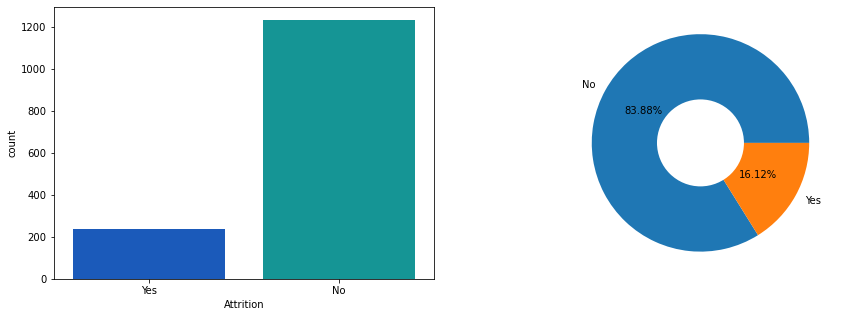

In [17]:
plt.figure(figsize=(15,5))
#colors = ['#cb3335','#59a257','#477ca8',]

plt.subplot(1,2,1)
sns.countplot(y, palette ='winter')

plt.subplot(1,2,2)
labels = 'No','Yes'
plt.pie(y.value_counts(),labels = labels,radius =1,autopct = '%1.2f%%')
#draw circle
centre_circle = plt.Circle((0,0),0.40,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

Observation - 83% employees have not left the job while 16% employees have left the job.

# Analysing Feature Variables

1) BusinessTravel

In [18]:
x['BusinessTravel'].unique()

array(['Travel_Rarely', 'Travel_Frequently', 'Non-Travel'], dtype=object)

In [19]:
x['BusinessTravel'].nunique()

3

In [20]:
x['BusinessTravel'].value_counts()

Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64

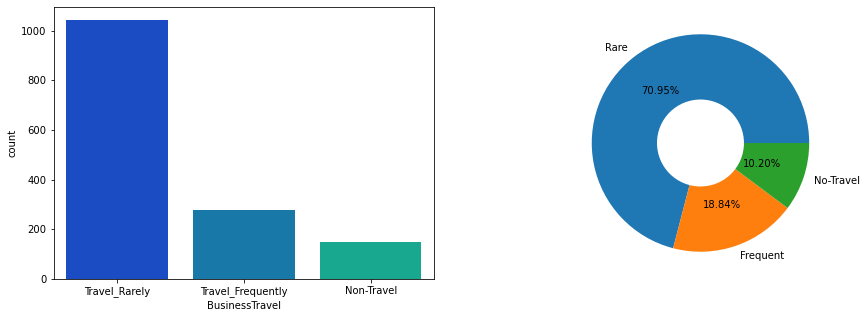

In [21]:
plt.figure(figsize=(15,5))
#colors = ['#cb3335','#59a257','#477ca8',]

plt.subplot(1,2,1)
sns.countplot(x['BusinessTravel'], palette ='winter')

plt.subplot(1,2,2)
labels = 'Rare','Frequent','No-Travel'
plt.pie(x['BusinessTravel'].value_counts(),labels = labels,radius =1,autopct = '%1.2f%%')
#draw circle
centre_circle = plt.Circle((0,0),0.40,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

Observation - Most of the employee travel rarely

2) Department

In [22]:
x['Department'].unique()

array(['Sales', 'Research & Development', 'Human Resources'], dtype=object)

In [23]:
x['Department'].nunique()

3

In [24]:
x['Department'].value_counts()

Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64

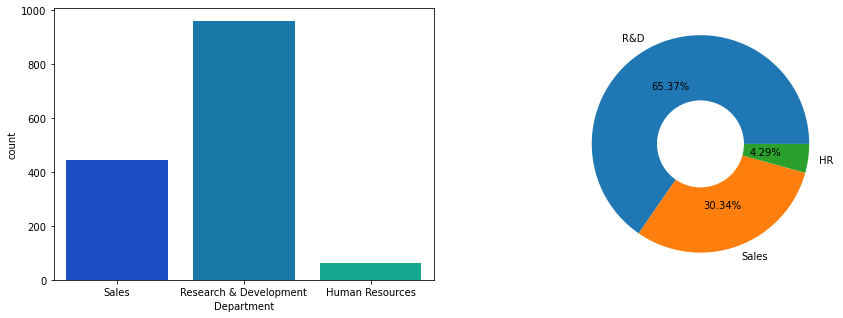

In [25]:
plt.figure(figsize=(15,5))
#colors = ['#cb3335','#59a257','#477ca8',]

plt.subplot(1,2,1)
sns.countplot(x['Department'], palette ='winter')

plt.subplot(1,2,2)
labels = 'R&D','Sales','HR'
plt.pie(x['Department'].value_counts(),labels = labels,radius =1,autopct = '%1.2f%%')
#draw circle
centre_circle = plt.Circle((0,0),0.40,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

Observation - Most of the employee in this dataset are from Research and Development Department

3) EducationField

In [26]:
x['EducationField'].unique()

array(['Life Sciences', 'Other', 'Medical', 'Marketing',
       'Technical Degree', 'Human Resources'], dtype=object)

In [27]:
x['EducationField'].nunique()

6

In [28]:
x['EducationField'].value_counts()

Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: EducationField, dtype: int64

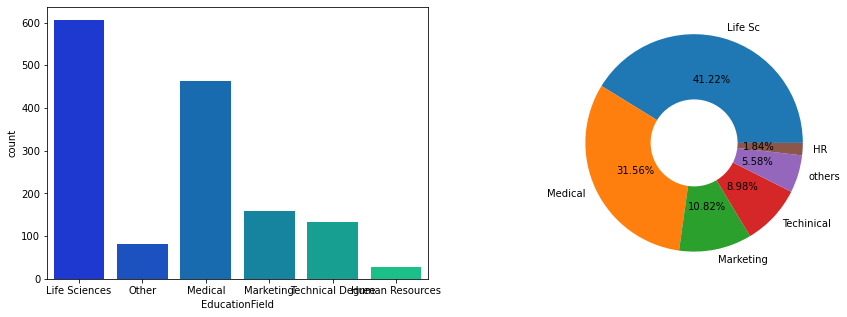

In [29]:
plt.figure(figsize=(15,5))
#colors = ['#cb3335','#59a257','#477ca8',]

plt.subplot(1,2,1)
sns.countplot(x['EducationField'], palette ='winter')

plt.subplot(1,2,2)
labels = 'Life Sc','Medical','Marketing','Techinical','others','HR'
plt.pie(x['EducationField'].value_counts(),labels = labels,radius =1,autopct = '%1.2f%%')
#draw circle
centre_circle = plt.Circle((0,0),0.40,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

Observation - Most of the employee are either from Life Sciences (606) or from Medical (464)

4) Gender

In [30]:
x['Gender'].unique()

array(['Female', 'Male'], dtype=object)

In [31]:
x['Gender'].nunique()

2

In [32]:
x['Gender'].value_counts()

Male      882
Female    588
Name: Gender, dtype: int64

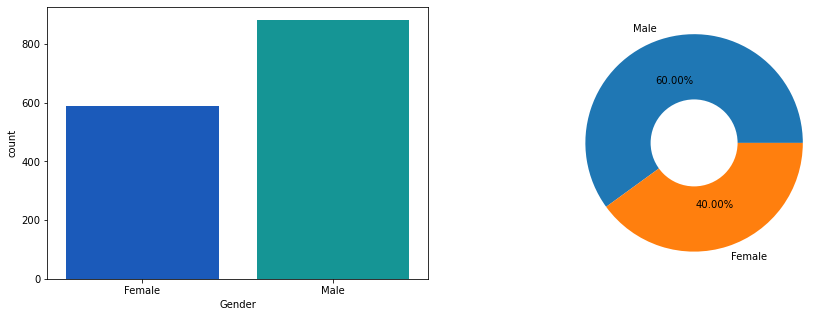

In [33]:
plt.figure(figsize=(15,5))
#colors = ['#cb3335','#59a257','#477ca8',]

plt.subplot(1,2,1)
sns.countplot(x['Gender'], palette ='winter')

plt.subplot(1,2,2)
labels = 'Male','Female'
plt.pie(x['Gender'].value_counts(),labels = labels,radius =1,autopct = '%1.2f%%')
#draw circle
centre_circle = plt.Circle((0,0),0.40,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

Observation - 882 employee are male while 588 are female

5) JobRole

In [34]:
x['JobRole'].unique()

array(['Sales Executive', 'Research Scientist', 'Laboratory Technician',
       'Manufacturing Director', 'Healthcare Representative', 'Manager',
       'Sales Representative', 'Research Director', 'Human Resources'],
      dtype=object)

In [35]:
x['JobRole'].nunique()

9

In [36]:
x['JobRole'].value_counts()

Sales Executive              326
Research Scientist           292
Laboratory Technician        259
Manufacturing Director       145
Healthcare Representative    131
Manager                      102
Sales Representative          83
Research Director             80
Human Resources               52
Name: JobRole, dtype: int64

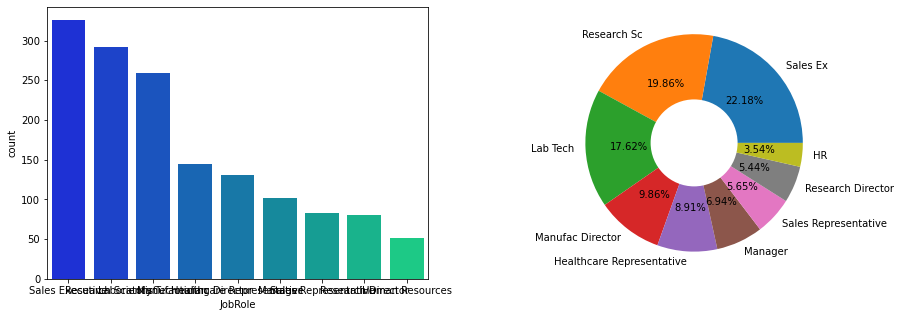

In [37]:
plt.figure(figsize=(15,5))
#colors = ['#cb3335','#59a257','#477ca8',]

plt.subplot(1,2,1)
sns.countplot(x['JobRole'], palette ='winter')

plt.subplot(1,2,2)
labels = 'Sales Ex', 'Research Sc', 'Lab Tech','Manufac Director', 'Healthcare Representative', 'Manager','Sales Representative', 'Research Director', 'HR'
plt.pie(x['JobRole'].value_counts(),labels = labels,radius =1,autopct = '%1.2f%%')
#draw circle
centre_circle = plt.Circle((0,0),0.40,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

Observation - Sales Executive, Research Scientist and Lab Technicians are the highest in number

6) MaritalStatus

In [38]:
x['MaritalStatus'].unique()

array(['Single', 'Married', 'Divorced'], dtype=object)

In [39]:
x['MaritalStatus'].nunique()

3

In [40]:
x['MaritalStatus'].value_counts()

Married     673
Single      470
Divorced    327
Name: MaritalStatus, dtype: int64

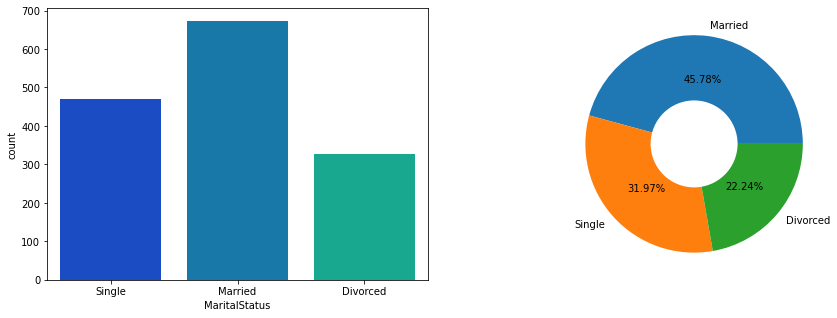

In [41]:
plt.figure(figsize=(15,5))
#colors = ['#cb3335','#59a257','#477ca8',]

plt.subplot(1,2,1)
sns.countplot(x['MaritalStatus'], palette="winter")

plt.subplot(1,2,2)
labels = 'Married','Single','Divorced'
plt.pie(x['MaritalStatus'].value_counts(),labels = labels,radius =1,autopct = '%1.2f%%')
#draw circle
centre_circle = plt.Circle((0,0),0.40,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

Observation - 45% employee are married, 31% are single and 22% are divorsed

7) OverTime

In [42]:
x['OverTime'].unique()

array(['Yes', 'No'], dtype=object)

In [43]:
x['OverTime'].nunique()

2

In [44]:
x['OverTime'].value_counts()

No     1054
Yes     416
Name: OverTime, dtype: int64

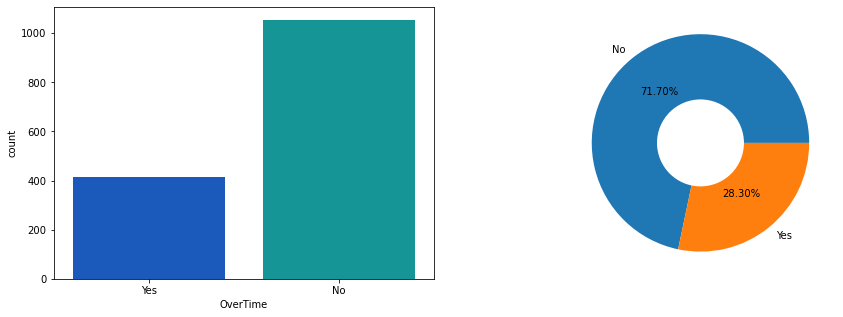

In [45]:
plt.figure(figsize=(15,5))
#colors = ['#cb3335','#59a257','#477ca8',]

plt.subplot(1,2,1)
sns.countplot(x['OverTime'], palette="winter")

plt.subplot(1,2,2)
labels = 'No','Yes'
plt.pie(x['OverTime'].value_counts(),labels = labels,radius =1,autopct = '%1.2f%%')
#draw circle
centre_circle = plt.Circle((0,0),0.40,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

Observation - only 28% employee do overtime

# Analysing Feature Variables wrt Attrition

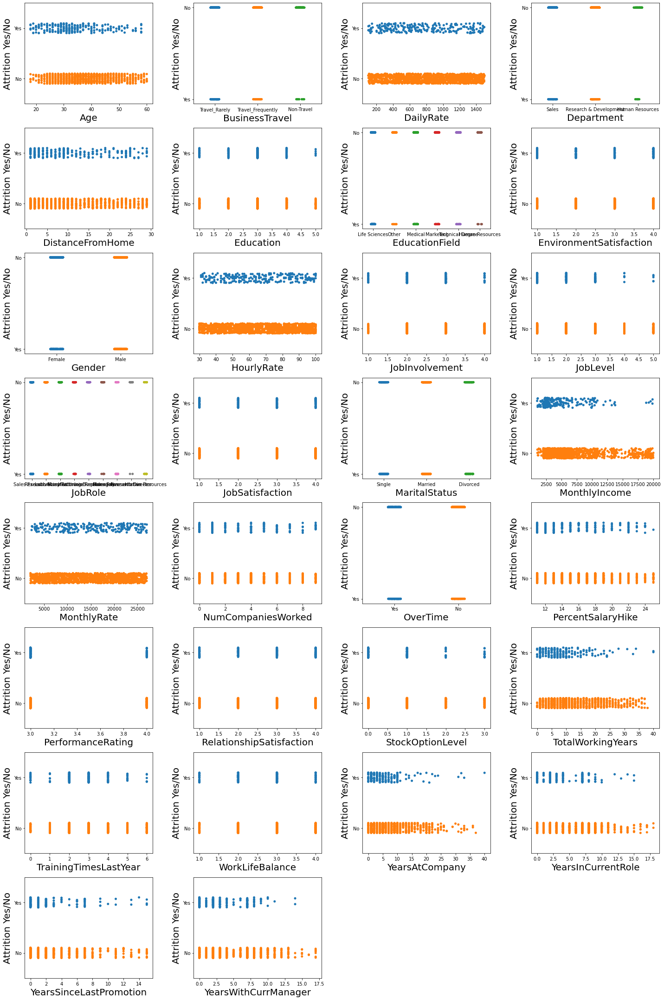

In [46]:
plt.figure(figsize=(20,30),facecolor='white')
plotnum=1
for col in x:
    if plotnum<=33:
        plt.subplot(8,4,plotnum)
        sns.stripplot(x[col],y)
        plt.ylabel('Attrition Yes/No',fontsize=20)
        plt.xlabel(col,fontsize=20)
    plotnum+=1
plt.tight_layout()

Observation - As an employee grows older with the company and his monthly income increases, his chances of leaving the company reduces

# Attrition wrt Age

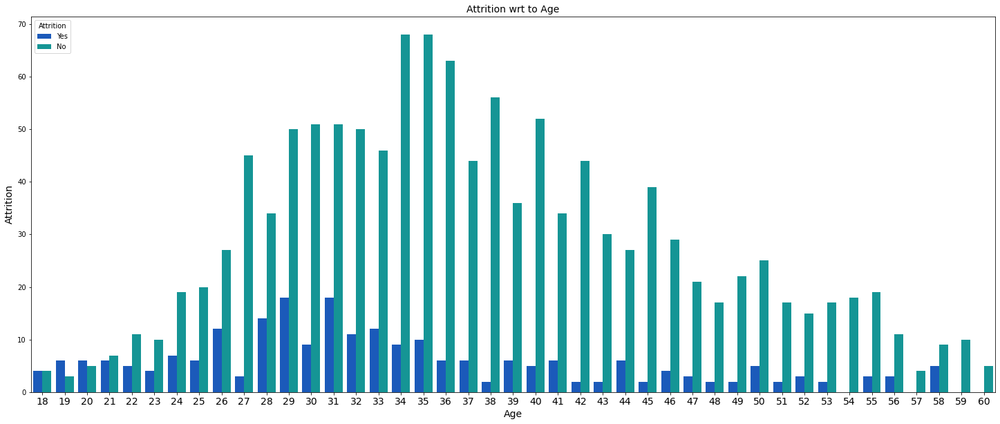

In [47]:
plt.figure(figsize = (25,10))
sns.countplot(x = 'Age', hue='Attrition', data = df,palette="winter")

plt.title('Attrition wrt to Age',fontsize=14)
plt.xlabel('Age',fontsize=14)
plt.xticks(fontsize=14)
plt.ylabel('Attrition',fontsize=14)
plt.show()

Observation - attrition rate is increases for employess with age 22 to mid thirties and again decreases, people with elder age do not tend to leave the job.

# Attrition wrt Gender

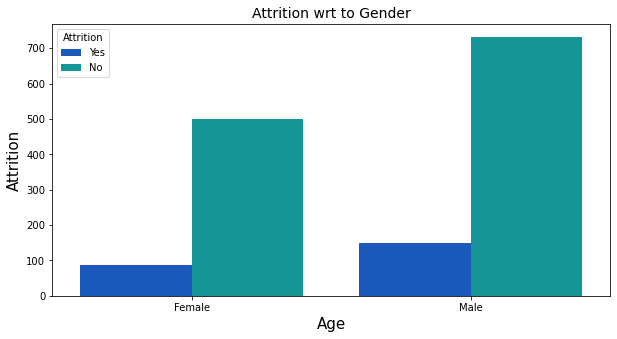

In [48]:
plt.figure(figsize = (10,5))
sns.countplot(x = 'Gender', hue = 'Attrition', data = df,palette="winter")

plt.title('Attrition wrt to Gender',fontsize=14)
plt.xlabel('Age',fontsize=15)
plt.ylabel('Attrition',fontsize=15)
plt.show()

Observation - Men are more likely to leave job than Women

# Attrition wrt to Job Level

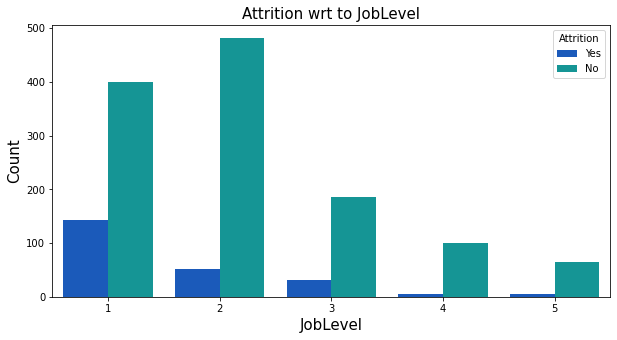

In [49]:
plt.figure(figsize = (10,5))
sns.countplot(x = 'JobLevel', hue = 'Attrition', data = df,palette="winter")
plt.title('Attrition wrt to JobLevel',fontsize=15)
plt.xlabel('JobLevel',fontsize=15)
plt.ylabel('Count',fontsize=15)
plt.show()

Observation - attrition rate increases with lower job level. People at Higher level are less likely to leave job

# Attrition wrt to Job Role

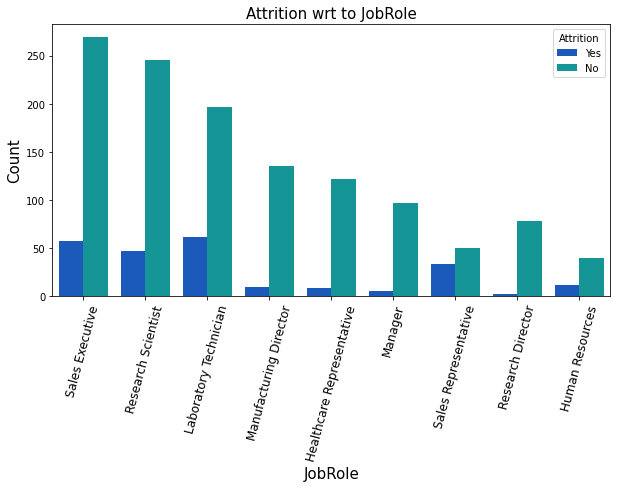

In [50]:
plt.figure(figsize = (10,5))
sns.countplot(x = 'JobRole', hue = 'Attrition', data = df,palette="winter")

plt.title('Attrition wrt to JobRole',fontsize=15)
plt.xlabel('JobRole',fontsize=15)
plt.ylabel('Count',fontsize=15)
plt.xticks(fontsize=12,rotation=75)
plt.show()

Observation - Atrrition is more in Lab technician, sales executive and research scientist jobs

# Attrition wrt Marital Status

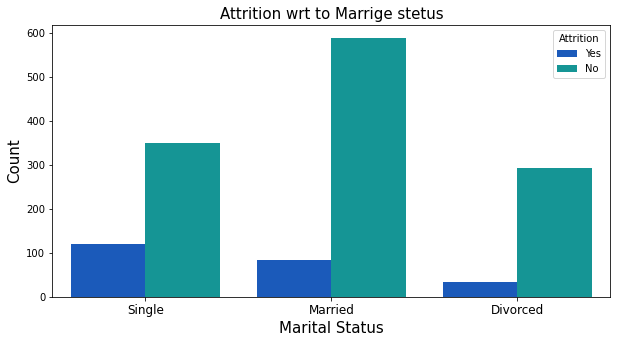

In [51]:
plt.figure(figsize = (10,5))
sns.countplot(x = 'MaritalStatus', hue = 'Attrition', data = df, palette="winter")

plt.title('Attrition wrt to Marrige stetus',fontsize=15)
plt.xlabel('Marital Status',fontsize=15)
plt.xticks(fontsize=12)
plt.ylabel('Count',fontsize=15)
plt.show()

Observation - Married and Divorced employee are more stable than single ones

# Attrition wrt to Total Working Years 

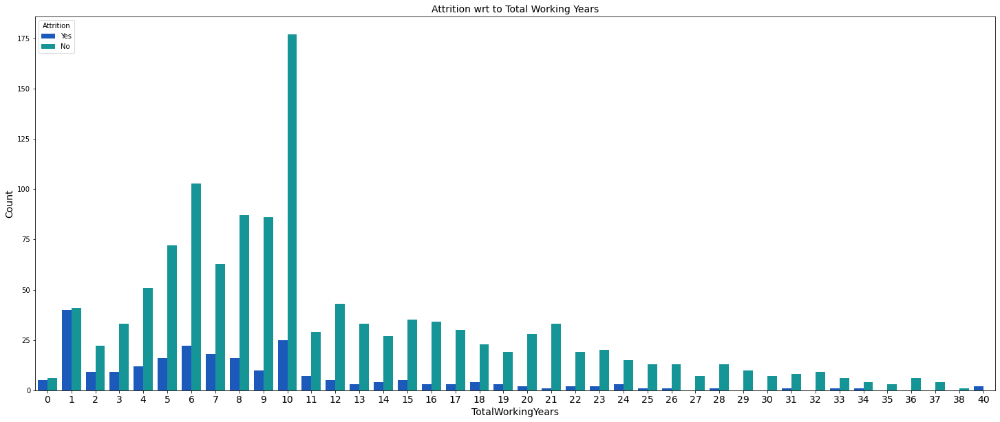

In [52]:
plt.figure(figsize = (25,10))
sns.countplot(x = 'TotalWorkingYears', hue = 'Attrition', data = df, palette="winter")

plt.title('Attrition wrt to Total Working Years',fontsize=14)
plt.xlabel('TotalWorkingYears',fontsize=14)
plt.xticks(fontsize=14)
plt.ylabel('Count',fontsize=14)
plt.show()

Observation - employees with 1 ro 10 years of job experience are more likely to leave the job. Employee with higher experiences are stable

# Attrition wrt to Years at Company

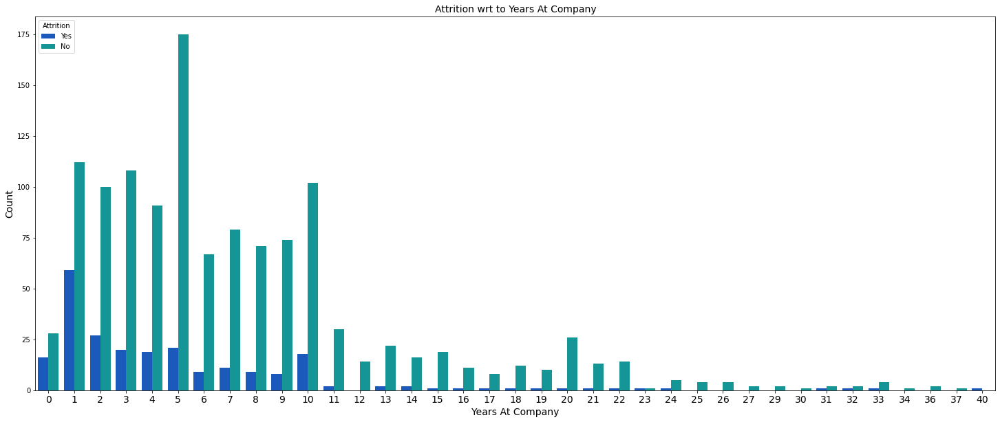

In [53]:
plt.figure(figsize = (25,10))
sns.countplot(x = 'YearsAtCompany', hue = 'Attrition', data = df, palette="winter")

plt.title('Attrition wrt to Years At Company',fontsize=14)
plt.xlabel('Years At Company',fontsize=14)
plt.xticks(fontsize=14)
plt.ylabel('Count',fontsize=14)
plt.show()

Observation - In first 5 years of joining, Attrition rate is higher

# Attrition wrt Percent Salary Hike

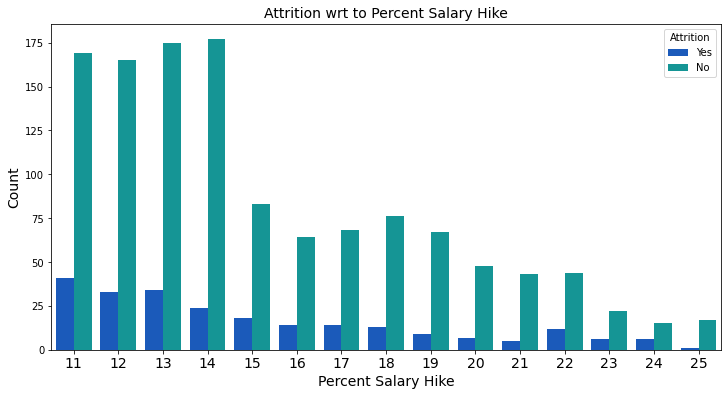

In [54]:
plt.figure(figsize = (12,6))
sns.countplot(x = 'PercentSalaryHike', hue = 'Attrition', data = df, palette="winter")

plt.title('Attrition wrt to Percent Salary Hike',fontsize=14)
plt.xlabel('Percent Salary Hike',fontsize=14)
plt.xticks(fontsize=14)
plt.ylabel('Count',fontsize=14)
plt.show()

Observation - Attrition rate becomes lesser as the salary hike rises

# Attrition wrt Overtime

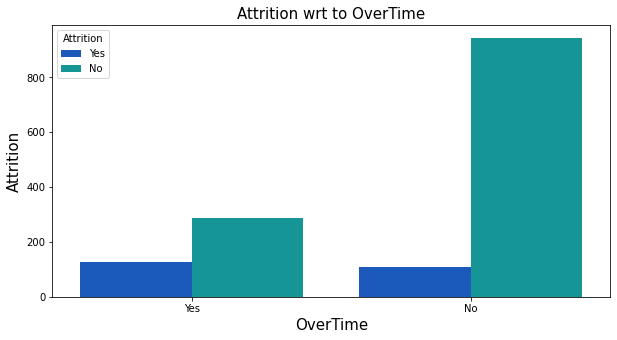

In [55]:
plt.figure(figsize = (10,5))
sns.countplot(x = 'OverTime', hue = 'Attrition', data = df,palette="winter")

plt.title('Attrition wrt to OverTime',fontsize=15)
plt.xlabel('OverTime',fontsize=15)
plt.ylabel('Attrition',fontsize=15)
plt.show()

Observation - employees working overtime are more likely to leave the job.

# Attrition wrt to Education Field

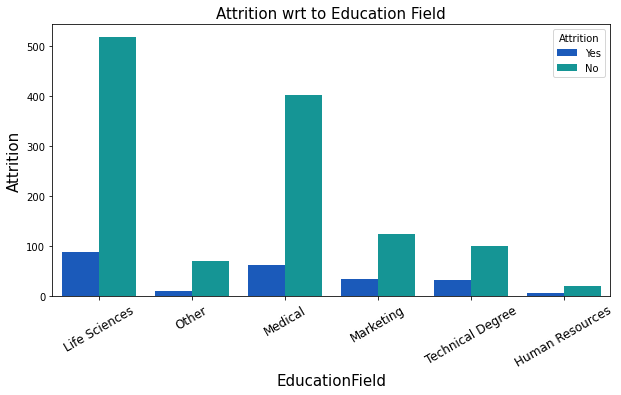

In [56]:
plt.figure(figsize = (10,5))
sns.countplot(x = 'EducationField', hue = 'Attrition', data = df,palette="winter")

plt.title('Attrition wrt to Education Field',fontsize=15)
plt.xlabel('EducationField',fontsize=15)
plt.xticks(fontsize=12,rotation=30)
plt.ylabel('Attrition',fontsize=15)
plt.show()

Observation - Departments like marketing, Tech and HR are having more Attrition rate

# Visualizing all data together

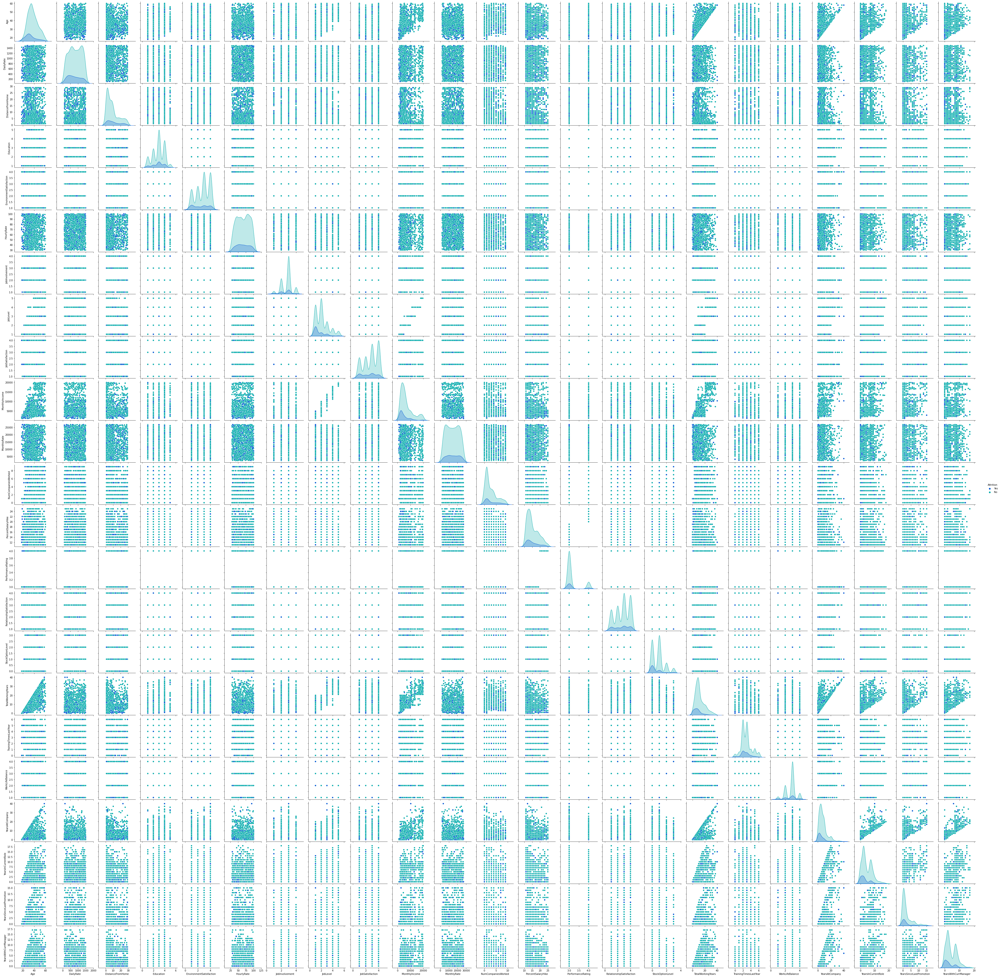

In [57]:
sns.pairplot(df, palette = 'winter', hue='Attrition')

# Label Encoding

In [58]:
#we need to convert categorical columns into numerical ones before proceeding further
label_encoder = preprocessing.LabelEncoder()

#encoding feature columns
df['BusinessTravel']=label_encoder.fit_transform(df['BusinessTravel'])

df['Department']=label_encoder.fit_transform(df['Department'])

df['EducationField']=label_encoder.fit_transform(df['EducationField'])

df['Gender']=label_encoder.fit_transform(df['Gender'])

df['JobRole']=label_encoder.fit_transform(df['JobRole'])

df['MaritalStatus']=label_encoder.fit_transform(df['MaritalStatus'])

df['OverTime']=label_encoder.fit_transform(df['OverTime'])

#encoding target columns
df['Attrition']=label_encoder.fit_transform(df['Attrition'])

In [59]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1470 entries, 0 to 1469
Data columns (total 31 columns):
 #   Column                    Non-Null Count  Dtype
---  ------                    --------------  -----
 0   Age                       1470 non-null   int64
 1   Attrition                 1470 non-null   int32
 2   BusinessTravel            1470 non-null   int32
 3   DailyRate                 1470 non-null   int64
 4   Department                1470 non-null   int32
 5   DistanceFromHome          1470 non-null   int64
 6   Education                 1470 non-null   int64
 7   EducationField            1470 non-null   int32
 8   EnvironmentSatisfaction   1470 non-null   int64
 9   Gender                    1470 non-null   int32
 10  HourlyRate                1470 non-null   int64
 11  JobInvolvement            1470 non-null   int64
 12  JobLevel                  1470 non-null   int64
 13  JobRole                   1470 non-null   int32
 14  JobSatisfaction           1470 non-null 

# Correlation

In [60]:
#lets find out the correlation between the columns
df.corr()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,-0.159205,0.024751,0.010661,-0.031882,-0.001686,0.208034,-0.040873,0.010146,-0.036311,...,0.001904,0.053535,0.037510,0.680381,-0.019621,-0.021490,0.311309,0.212901,0.216513,0.202089
Attrition,-0.159205,1.000000,0.000074,-0.056652,0.063991,0.077924,-0.031373,0.026846,-0.103369,0.029453,...,0.002889,-0.045872,-0.137145,-0.171063,-0.059478,-0.063939,-0.134392,-0.160545,-0.033019,-0.156199
BusinessTravel,0.024751,0.000074,1.000000,-0.004086,-0.009044,-0.024469,0.000757,0.023724,0.004174,-0.032981,...,-0.026341,-0.035986,-0.016727,0.034226,0.015240,-0.011256,-0.014575,-0.011497,-0.032591,-0.022636
DailyRate,0.010661,-0.056652,-0.004086,1.000000,0.007109,-0.004985,-0.016806,0.037709,0.018355,-0.011716,...,0.000473,0.007846,0.042143,0.014515,0.002453,-0.037848,-0.034055,0.009932,-0.033229,-0.026363
Department,-0.031882,0.063991,-0.009044,0.007109,1.000000,0.017225,0.007996,0.013720,-0.019395,-0.041583,...,-0.024604,-0.022414,-0.012193,-0.015762,0.036875,0.026383,0.022920,0.056315,0.040061,0.034282
DistanceFromHome,-0.001686,0.077924,-0.024469,-0.004985,0.017225,1.000000,0.021042,0.002013,-0.016075,-0.001851,...,0.027110,0.006557,0.044872,0.004628,-0.036942,-0.026556,0.009508,0.018845,0.010029,0.014406
Education,0.208034,-0.031373,0.000757,-0.016806,0.007996,0.021042,1.000000,-0.039592,-0.027128,-0.016547,...,-0.024539,-0.009118,0.018422,0.148280,-0.025100,0.009819,0.069114,0.060236,0.054254,0.069065
EducationField,-0.040873,0.026846,0.023724,0.037709,0.013720,0.002013,-0.039592,1.000000,0.043163,-0.002504,...,-0.005614,-0.004378,-0.016185,-0.027848,0.049195,0.041191,-0.018692,-0.010506,0.002326,-0.004130
EnvironmentSatisfaction,0.010146,-0.103369,0.004174,0.018355,-0.019395,-0.016075,-0.027128,0.043163,1.000000,0.000508,...,-0.029548,0.007665,0.003432,-0.002693,-0.019359,0.027627,0.001458,0.018007,0.016194,-0.004999
Gender,-0.036311,0.029453,-0.032981,-0.011716,-0.041583,-0.001851,-0.016547,-0.002504,0.000508,1.000000,...,-0.013859,0.022868,0.012716,-0.046881,-0.038787,-0.002753,-0.029747,-0.041483,-0.026985,-0.030599


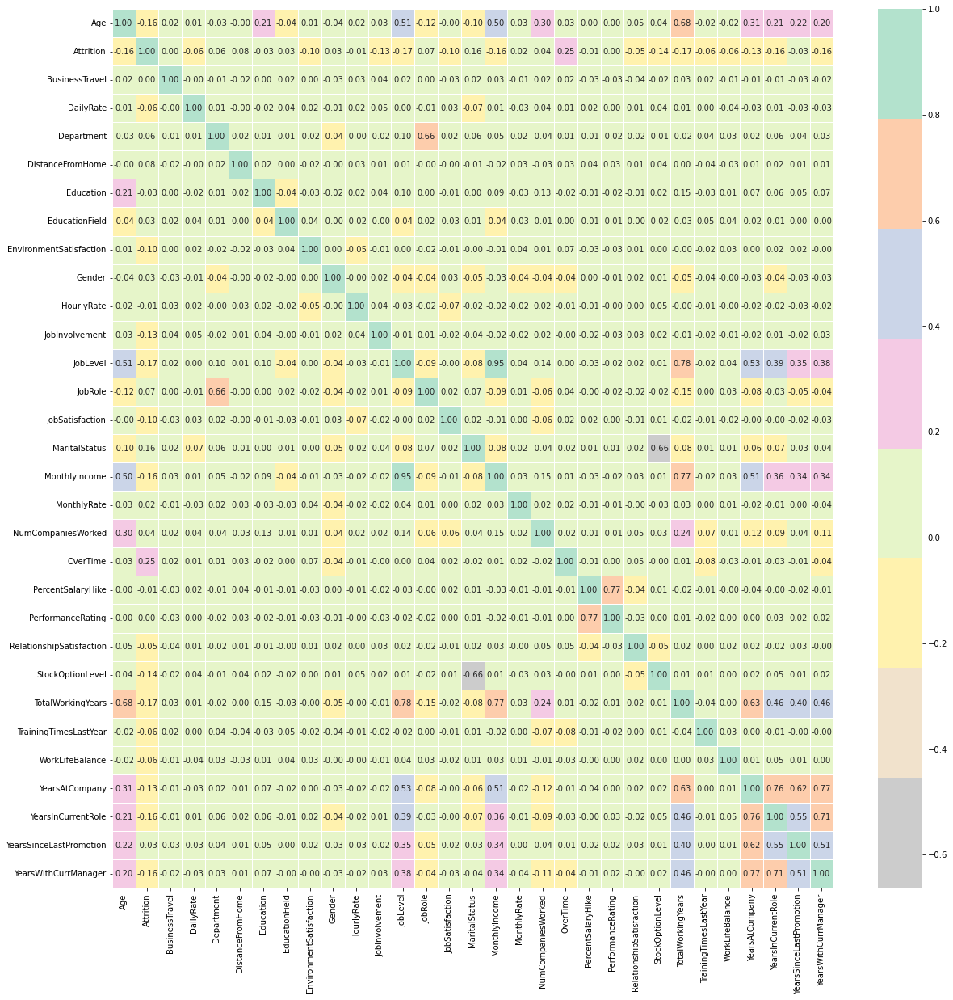

In [61]:
#lets plot the correlation
plt.figure(figsize=(20,20))
sns.heatmap(df.corr(),annot=True,fmt='0.2f',linewidth=1,cmap='Pastel2_r')
plt.show()

Observation -
- We can see with the heatmap that highest correlation ie 96 % exists between the job level and monthly Income which is obvious that monthly income increases with job level.
- Second highest correlation exist ie 78 % between Total working years and joblevel.
- Also 77 % correlation exists between the Total working years and monthly income.
- 71 % correlation exists between Years with current maneger and Years in current role.
- Multicollnearity can also be seen between yearsAtCompany, YearsInCurrentRole, YearsSinceLastPosition, YearsWithCurrManager, we need to Check VIF score later on to predict this

In [62]:
#lets find out the correlation of Feature variables with target variable 
df.corr()['Attrition'].sort_values()

TotalWorkingYears          -0.171063
JobLevel                   -0.169105
YearsInCurrentRole         -0.160545
MonthlyIncome              -0.159840
Age                        -0.159205
YearsWithCurrManager       -0.156199
StockOptionLevel           -0.137145
YearsAtCompany             -0.134392
JobInvolvement             -0.130016
JobSatisfaction            -0.103481
EnvironmentSatisfaction    -0.103369
WorkLifeBalance            -0.063939
TrainingTimesLastYear      -0.059478
DailyRate                  -0.056652
RelationshipSatisfaction   -0.045872
YearsSinceLastPromotion    -0.033019
Education                  -0.031373
PercentSalaryHike          -0.013478
HourlyRate                 -0.006846
BusinessTravel              0.000074
PerformanceRating           0.002889
MonthlyRate                 0.015170
EducationField              0.026846
Gender                      0.029453
NumCompaniesWorked          0.043494
Department                  0.063991
JobRole                     0.067151
D

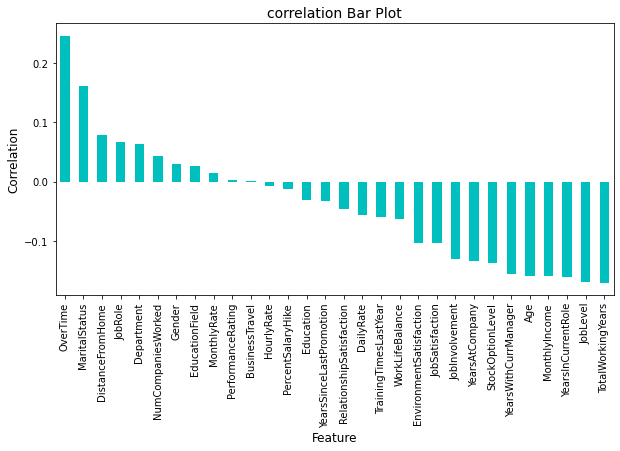

In [63]:
#Plotting the correlation
plt.figure(figsize=(10,5))
df.corr()['Attrition'].sort_values(ascending=False).drop(['Attrition']).plot(kind='bar' ,color='c')
plt.xlabel('Feature' ,fontsize=12)
plt.ylabel('Correlation',fontsize=12)
plt.title('correlation Bar Plot',fontsize=14)
plt.show()

Observation - Some of the columns have +ve correlation with target while other have -ve Correlation

# Detecting Multicollinearity with VIF and Data Cleaning

Observed using heatmap that some of the feature variable have good correaltion which causes multicollinearity. lets test that using VIF score

In [64]:
#separating the Features and Target Variable
x = df.drop(columns = ['Attrition'])
y = df['Attrition']

In [65]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
# VIF dataframe
vif_data = pd.DataFrame()

vif_data["feature"] = x.columns
vif_data["VIF"] = [variance_inflation_factor(x.values, i) for i in range(len(x.columns))]
print(vif_data)

                     feature         VIF
0                        Age   33.303362
1             BusinessTravel    6.744873
2                  DailyRate    4.973985
3                 Department   12.973418
4           DistanceFromHome    2.317141
5                  Education    9.453687
6             EducationField    3.866745
7    EnvironmentSatisfaction    7.109660
8                     Gender    2.506220
9                 HourlyRate   11.244053
10            JobInvolvement   15.098622
11                  JobLevel   52.565598
12                   JobRole    8.078981
13           JobSatisfaction    7.023244
14             MaritalStatus    5.787900
15             MonthlyIncome   32.084632
16               MonthlyRate    5.011517
17        NumCompaniesWorked    2.726026
18                  OverTime    1.433417
19         PercentSalaryHike   42.266379
20         PerformanceRating  122.382855
21  RelationshipSatisfaction    7.271234
22          StockOptionLevel    3.323906
23         Total

VIF values ranging between 1 and 10 are moderate. They represent a medium level of collinearity. Values of more than 10 are highly collinear.

Observation-

As VIF score for PerformanceRating is quite high and this column doesn't have strong bond with Target so Lets drop that column and check VIF again

In [66]:
# VIF dataframe
vif_data1 = pd.DataFrame()

x.drop(['PerformanceRating'],axis=1, inplace=True)

vif_data1["feature"] = x.columns
vif_data1["VIF"] = [variance_inflation_factor(x.values, i) for i in range(len(x.columns))]
print(vif_data1)

                     feature        VIF
0                        Age  32.333301
1             BusinessTravel   6.633467
2                  DailyRate   4.944893
3                 Department  12.952509
4           DistanceFromHome   2.314190
5                  Education   9.387247
6             EducationField   3.834849
7    EnvironmentSatisfaction   7.004462
8                     Gender   2.494526
9                 HourlyRate  10.890120
10            JobInvolvement  14.690634
11                  JobLevel  52.349839
12                   JobRole   8.074713
13           JobSatisfaction   6.915159
14             MaritalStatus   5.684433
15             MonthlyIncome  31.983812
16               MonthlyRate   4.956012
17        NumCompaniesWorked   2.724815
18                  OverTime   1.430974
19         PercentSalaryHike  16.019156
20  RelationshipSatisfaction   7.163578
21          StockOptionLevel   3.287968
22         TotalWorkingYears  14.515030
23     TrainingTimesLastYear   5.665666


Observation - VIF is under moderate range now lets select best Features using K best Features Method

In [67]:
df.drop(['PerformanceRating'],axis=1, inplace=True)

In [68]:
df.shape

(1470, 30)

# Feature Selection

Statistical tests can be used to select those features that have the strongest relationship with the output variables. The scikit-learn library provides the SelectKBest with f_classif() class that can be used with a suite of different statistical tests to select a specific number of features.

In [69]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif

best_feature = SelectKBest(score_func=f_classif, k=8)
fit = best_feature.fit(x, y)

dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(x.columns)

# concat two dataframes for better visualization
featureScores = pd.concat([dfcolumns, dfscores], axis=1)
featureScores.columns = ['Specs', 'Score']  #naming the dataframe column

featureScores.sort_values(by=['Score'], ascending=False)

,Specs,Score
18,OverTime,94.656457
22,TotalWorkingYears,44.252491
11,JobLevel,43.215344
14,MaritalStatus,39.599763
26,YearsInCurrentRole,38.838303
15,MonthlyIncome,38.488819
0,Age,38.175887
28,YearsWithCurrManager,36.712311
21,StockOptionLevel,28.140501
25,YearsAtCompany,27.001624


Observation - MonthlyRate, PercentSalaryHike, HourlyRate, BusinessTravel are least significant for training the model, hence dropping these too


In [70]:
x = x.drop(['MonthlyRate','PercentSalaryHike','HourlyRate','BusinessTravel'], axis = 1)
df = df.drop(['MonthlyRate','PercentSalaryHike','HourlyRate','BusinessTravel'], axis = 1)

In [72]:
df.shape

(1470, 26)

# Skewness

In [73]:
df.skew()

Age                         0.413286
Attrition                   1.844366
DailyRate                  -0.003519
Department                  0.172231
DistanceFromHome            0.958118
Education                  -0.289681
EducationField              0.550371
EnvironmentSatisfaction    -0.321654
Gender                     -0.408665
JobInvolvement             -0.498419
JobLevel                    1.025401
JobRole                    -0.357270
JobSatisfaction            -0.329672
MaritalStatus              -0.152175
MonthlyIncome               1.369817
NumCompaniesWorked          1.026471
OverTime                    0.964489
RelationshipSatisfaction   -0.302828
StockOptionLevel            0.968980
TotalWorkingYears           1.117172
TrainingTimesLastYear       0.553124
WorkLifeBalance            -0.552480
YearsAtCompany              1.764529
YearsInCurrentRole          0.917363
YearsSinceLastPromotion     1.984290
YearsWithCurrManager        0.833451
dtype: float64

Observation-

The acceptable skewness range is +/- 0.5, Attrition, JobLevel, MonthlyIncome, NumCompaniesWorked, StockOptionLevel, OverTime, TotalWorkingYears, YearsAtCompany, YearsInCurrentRole, YearsSinceLastPromotion, YearsWithCurrManager have skewness involved.

# Distribution Curve

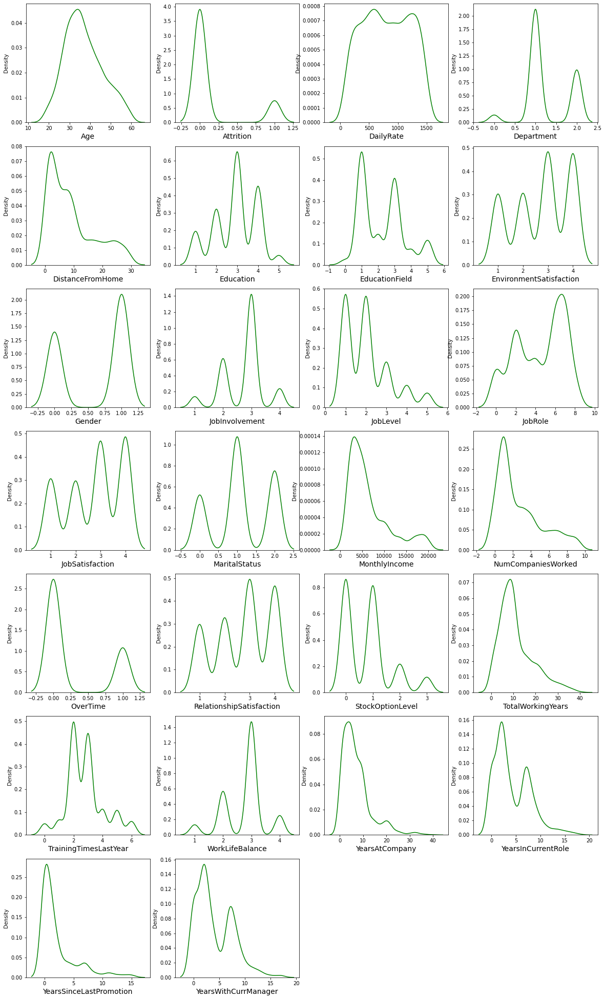

In [81]:
plt.figure(figsize=(20,35),facecolor='white')
plotnum=1
for col in df.columns:
    if plotnum<=26:
        plt.subplot(7,4,plotnum)
        sns.kdeplot(df[col], color = 'g')
        plt.xlabel(col,fontsize=14)
    plotnum+=1
plt.show()

Observation - There is considerable amount of skewness in all feature variables and target. we need to treat it but first of all we need to check outliers and remove that

# Checking Outliers

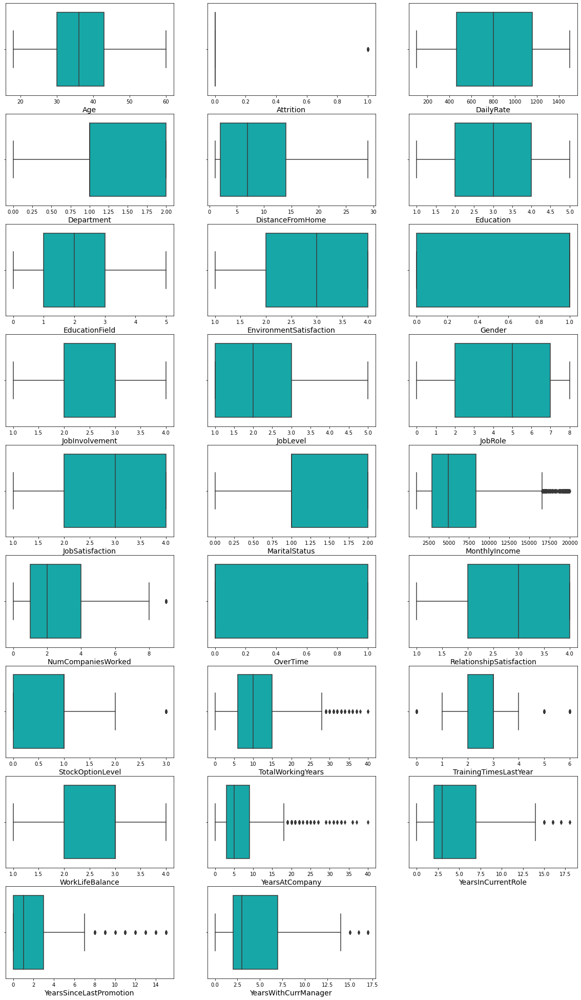

In [80]:
plt.figure(figsize=(20,35),facecolor='white')
plotnum=1
for col in df.columns:
    if plotnum<=26:
        plt.subplot(9,3,plotnum)
        sns.boxplot(df[col], color='c')
        plt.xlabel(col,fontsize=14)
    plotnum+=1
plt.show()

Observation - as expected some of the feature variables and target variable have outliers. lets treat them with the help of z score method

# Removing Outliers

In [82]:
#using z-score method
from scipy.stats import zscore #import zscore from scipy library
zscore(df)

,Age,Attrition,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,JobInvolvement,...,OverTime,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0.446350,2.280906,0.742527,1.401512,-1.010909,-0.891688,-0.937414,-0.660531,-1.224745,0.379672,...,1.591746,-1.584178,-0.932014,-0.421642,-2.171982,-2.493820,-0.164613,-0.063296,-0.679146,0.245834
1,1.322365,-0.438422,-1.297775,-0.493817,-0.147150,-1.868426,-0.937414,0.254625,0.816497,-1.026167,...,-0.628241,1.191438,0.241988,-0.164511,0.155707,0.338096,0.488508,0.764998,-0.368715,0.806541
2,0.008343,2.280906,1.414363,-0.493817,-0.887515,-0.891688,1.316673,1.169781,0.816497,-1.026167,...,1.591746,-0.658973,-0.932014,-0.550208,0.155707,0.338096,-1.144294,-1.167687,-0.679146,-1.155935
3,-0.429664,-0.438422,1.461466,-0.493817,-0.764121,1.061787,-0.937414,1.169781,-1.224745,0.379672,...,1.591746,0.266233,-0.932014,-0.421642,0.155707,0.338096,0.161947,0.764998,0.252146,-1.155935
4,-1.086676,-0.438422,-0.524295,-0.493817,-0.887515,-1.868426,0.565311,-1.575686,0.816497,0.379672,...,-0.628241,1.191438,0.241988,-0.678774,0.155707,0.338096,-0.817734,-0.615492,-0.058285,-0.595227
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,-0.101159,-0.438422,0.202082,-0.493817,1.703764,-0.891688,0.565311,0.254625,0.816497,1.785511,...,-0.628241,0.266233,0.241988,0.735447,0.155707,0.338096,-0.327893,-0.615492,-0.679146,-0.314873
1466,0.227347,-0.438422,-0.469754,-0.493817,-0.393938,-1.868426,0.565311,1.169781,0.816497,-1.026167,...,-0.628241,-1.584178,0.241988,-0.293077,1.707500,0.338096,-0.001333,0.764998,-0.368715,0.806541
1467,-1.086676,-0.438422,-1.605183,-0.493817,-0.640727,0.085049,-0.937414,-0.660531,0.816497,1.785511,...,1.591746,-0.658973,0.241988,-0.678774,-2.171982,0.338096,-0.164613,-0.615492,-0.679146,-0.314873
1468,1.322365,-0.438422,0.546677,1.401512,-0.887515,0.085049,0.565311,1.169781,0.816497,-1.026167,...,-0.628241,1.191438,-0.932014,0.735447,0.155707,-1.077862,0.325228,0.488900,-0.679146,1.086895


In [83]:
z = np.abs(zscore(df))
z.shape

(1470, 26)

In [84]:
np.where(z>3) #detecting outliers where z>3

(array([  28,   45,   62,   62,   63,   64,   85,   98,   98,  110,  123,
         123,  123,  126,  126,  126,  153,  178,  187,  187,  190,  190,
         218,  231,  231,  237,  237,  270,  270,  281,  326,  386,  386,
         401,  411,  425,  425,  427,  445,  466,  473,  477,  535,  561,
         561,  584,  592,  595,  595,  595,  616,  624,  635,  653,  653,
         677,  686,  701,  716,  746,  749,  752,  799,  838,  861,  861,
         875,  875,  894,  914,  914,  918,  922,  926,  926,  937,  956,
         962,  976,  976, 1008, 1024, 1043, 1078, 1078, 1086, 1086, 1093,
        1111, 1116, 1116, 1135, 1138, 1138, 1156, 1184, 1221, 1223, 1242,
        1295, 1301, 1301, 1303, 1327, 1331, 1348, 1351, 1401, 1414, 1430],
       dtype=int64),
 array([25, 24, 22, 24, 23, 24, 19, 19, 22, 24, 23, 24, 25, 19, 22, 24, 25,
        24, 19, 25, 22, 23, 24, 23, 25, 22, 24, 19, 22, 23, 24, 24, 25, 19,
        22, 22, 24, 24, 19, 23, 22, 22, 24, 22, 25, 24, 22, 19, 22, 24, 25,
        19

In [85]:
z.iloc[686] #checking one of the detected outliers

Age                         0.446350
Attrition                   0.438422
DailyRate                   1.337440
Department                  0.493817
DistanceFromHome            0.393938
Education                   0.085049
EducationField              0.565311
EnvironmentSatisfaction     1.169781
Gender                      0.816497
JobInvolvement              0.379672
JobLevel                    0.961486
JobRole                     0.998992
JobSatisfaction             1.567907
MaritalStatus               1.236820
MonthlyIncome               0.378622
NumCompaniesWorked          0.277594
OverTime                    1.591746
RelationshipSatisfaction    0.266233
StockOptionLevel            0.932014
TotalWorkingYears           1.121144
TrainingTimesLastYear       0.155707
WorkLifeBalance             0.338096
YearsAtCompany              1.794749
YearsInCurrentRole          2.421585
YearsSinceLastPromotion     0.058285
YearsWithCurrManager        3.610079
Name: 686, dtype: float64

In [86]:
#checking total number of rows where z>3
len(np.where(z>3)[0])

110

In [87]:
#percent loss
percent_loss = 110*100/1470
print("Percent Loss: ",percent_loss)

Percent Loss:  7.482993197278912


This is in acceptable range, so removing the entries where z score for any of the feature variable is >3

In [88]:
#removing outliers

df_new = df[(z<3).all(axis=1)]

print("Old Data Frame:",df.shape)
print("New Data Frame:",df_new.shape)
print("Total Dropped Rows:",df.shape[0] - df_new.shape[0])

Old Data Frame: (1470, 26)
New Data Frame: (1387, 26)
Total Dropped Rows: 83


In [89]:
df_new.head()

,Age,Attrition,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,JobInvolvement,...,OverTime,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,1102,2,1,2,1,2,0,3,...,1,1,0,8,0,1,6,4,0,5
1,49,0,279,1,8,1,1,3,1,2,...,0,4,1,10,3,3,10,7,1,7
2,37,1,1373,1,2,2,4,4,1,2,...,1,2,0,7,3,3,0,0,0,0
3,33,0,1392,1,3,4,1,4,0,3,...,1,3,0,8,3,3,8,7,3,0
4,27,0,591,1,2,1,3,1,1,3,...,0,4,1,6,3,3,2,2,2,2


# Checking Outliers again using boxplot

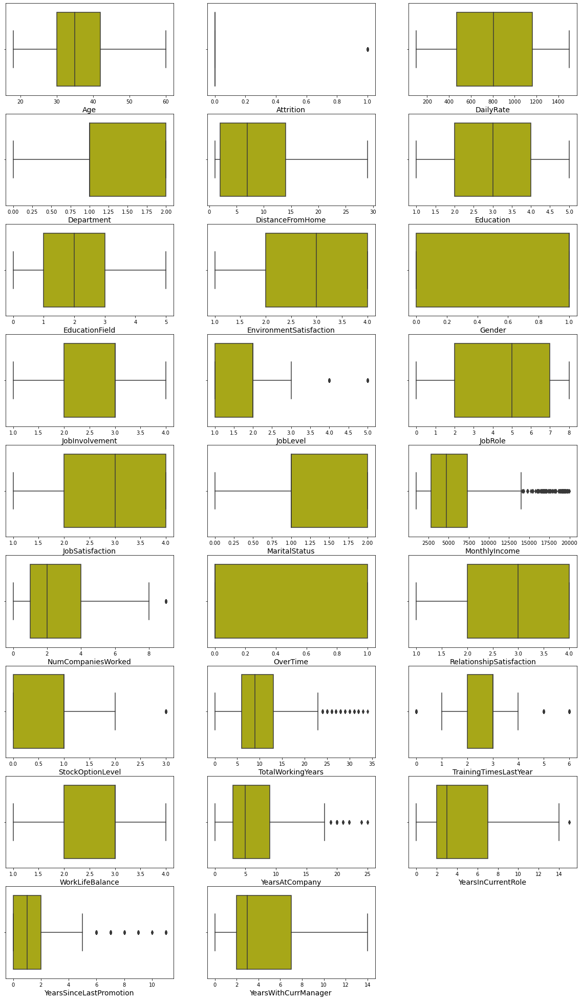

In [90]:
plt.figure(figsize=(20,35),facecolor='white')
plotnum=1
for col in df_new.columns:
    if plotnum<=26:
        plt.subplot(9,3,plotnum)
        sns.boxplot(df_new[col], color='y')
        plt.xlabel(col,fontsize=14)
    plotnum+=1
plt.show()

Observation - outliers have been treated to some extent. Lets implement IQR method to treat outliers

# Treating Outliers using IQR method

In [91]:
X = df_new.drop('Attrition', axis=1)
Y = df_new['Attrition']

In [92]:
#create new dataframe
X_new = pd.DataFrame()

In [93]:
def detect_and_treat_outliers_iqr(data):
    new_list = []
    #data = sorted(data)
    
    median = np.median(data)# calculating median 

    q1 = np.percentile(data, 25)
    q3 = np.percentile(data, 75)

    IQR = q3-q1
    lwr_bound = q1-(1.5*IQR)
    upr_bound = q3+(1.5*IQR)
    
    for i in data: 
        if (i<lwr_bound or i>upr_bound):
            i = median    #replacing outlier with median as all the variables are of integer type
        new_list.append(i)
    return new_list 


for col in X.columns:
    X_new[col] = detect_and_treat_outliers_iqr(X[col])
    
X_new.head()

,Age,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,JobInvolvement,JobLevel,...,OverTime,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1102,2,1,2,1,2,0,3,2.0,...,1,1,0.0,8.0,3.0,1,6.0,4.0,0.0,5
1,49,279,1,8,1,1,3,1,2,2.0,...,0,4,1.0,10.0,3.0,3,10.0,7.0,1.0,7
2,37,1373,1,2,2,4,4,1,2,1.0,...,1,2,0.0,7.0,3.0,3,0.0,0.0,0.0,0
3,33,1392,1,3,4,1,4,0,3,1.0,...,1,3,0.0,8.0,3.0,3,8.0,7.0,3.0,0
4,27,591,1,2,1,3,1,1,3,1.0,...,0,4,1.0,6.0,3.0,3,2.0,2.0,2.0,2


In the above method we detected the Outliers using IQR method and replaced them with median

# Ploting Boxplot

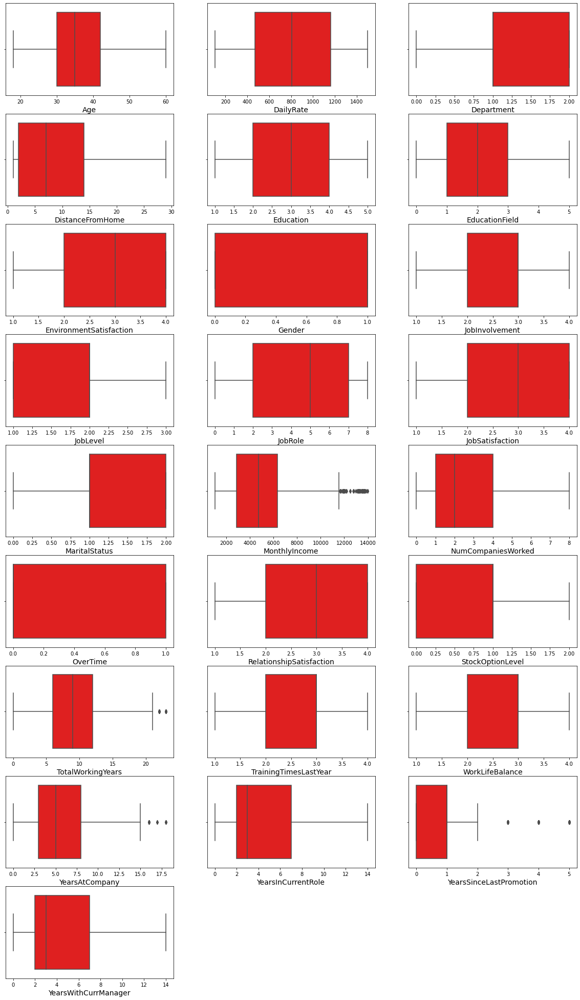

In [98]:
plt.figure(figsize=(20,35),facecolor='white')
plotnum=1
for col in X_new.columns:
    if plotnum<=26:
        plt.subplot(9,3,plotnum)
        sns.boxplot(X_new[col], color='r')
        plt.xlabel(col,fontsize=14)
    plotnum+=1
plt.show()

Observation - Outliers are still present in some of the feature variables that can be treated using normalization techniques later

# Balancing Target Variable

In [95]:
Y.value_counts()

0    1158
1     229
Name: Attrition, dtype: int64

<AxesSubplot:xlabel='Attrition', ylabel='count'>

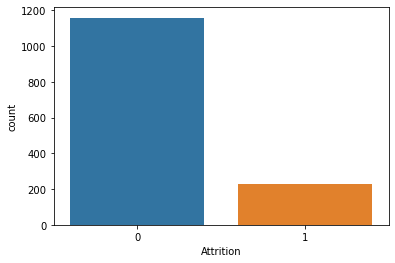

In [96]:
sns.countplot(Y)

In [97]:
from imblearn.over_sampling import SMOTE
smt = SMOTE()
X,Y = smt.fit_resample(X_new,Y,)
X,Y

(      Age  DailyRate  Department  DistanceFromHome  Education  EducationField  \
 0      41       1102           2                 1          2               1   
 1      49        279           1                 8          1               1   
 2      37       1373           1                 2          2               4   
 3      33       1392           1                 3          4               1   
 4      27        591           1                 2          1               3   
 ...   ...        ...         ...               ...        ...             ...   
 2311   27        371           2                11          2               1   
 2312   41        387           1                16          2               2   
 2313   18        535           2                12          1               2   
 2314   32        289           2                22          3               1   
 2315   55        591           1                 6          3               2   
 
       Environ

<AxesSubplot:xlabel='Attrition', ylabel='count'>

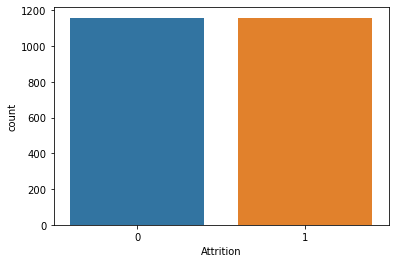

In [99]:
sns.countplot(Y)

In [100]:
X.shape

(2316, 25)

In [101]:
Y.shape

(2316,)

Target data has been balanced using SMOTE

# Transforming data to remove skewness further (Power Transform)

In [102]:
from sklearn.preprocessing import power_transform

X = power_transform(X, method='yeo-johnson')
type(X)

numpy.ndarray

In [103]:
X.mean()

1.4088135762566407e-16

In [104]:
X.std()

1.0

mean = 0 and Standard deviation = 1, our feature variable are normalized now

# Feature Scaling using Standard Scaler

In [106]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
X = pd.DataFrame(sc.fit_transform(X))
X.head()

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
0,0.784917,0.838112,1.454441,-1.576298,-0.767799,-0.901624,-0.368457,-1.078177,0.641886,0.688771,...,1.528782,-1.461575,-1.057331,0.067158,0.568053,-1.949616,0.474696,0.462528,-1.161586,0.804897
1,1.499509,-1.326700,-0.368284,0.109413,-1.743875,-0.901624,0.539131,0.927492,-0.710094,0.688771,...,-0.654115,1.408172,0.873096,0.441910,0.568053,0.519044,1.284410,1.176572,0.482489,1.203322
2,0.373551,1.399386,-0.368284,-1.158670,-0.767799,1.358274,1.380888,0.927492,-0.710094,-1.026913,...,1.528782,-0.483297,-1.057331,-0.135754,0.568053,0.519044,-2.135948,-1.564163,-1.161586,-1.391714
3,-0.084615,1.437183,-0.368284,-0.846553,1.319938,-0.901624,1.380888,-1.078177,0.641886,-1.026913,...,1.528782,0.471118,-1.057331,0.067158,0.568053,0.519044,0.913653,1.176572,1.556831,-1.391714
4,-0.886933,-0.380982,-0.368284,-1.158670,-1.743875,0.791349,-1.372905,0.927492,0.641886,-1.026913,...,-0.654115,1.408172,0.873096,-0.351662,0.568053,0.519044,-0.818314,-0.246710,1.165559,-0.100841


# Model Building

As this is a binary classification Problem, I will train the follwoing models -

- A. Logistic Regression
- B. Decision Trees
- C. Random Forests
- D. SVC linear kernel
- E. SGD Classifier
- F. KNN (K_nearest_neighbors)
- G. AdaBoost Classifier
- H. Gradiant Boost Classifier
- I. Bagging Classifier

In [115]:
#importing Libraries

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix,classification_report,roc_auc_score,f1_score,roc_curve
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, KFold
import warnings
warnings.filterwarnings('ignore')

# Finding best Random State

In [110]:
#Choosing the best random state for our ML Model
maxAccu = 0
maxRS = 0
for i in range(1,200):
    x_train, x_test,y_train,y_test = train_test_split(X,Y,test_size = 0.20,random_state = i)
    lr = LogisticRegression()
    lr.fit(x_train, y_train)
    
    pred_train = lr.predict(x_train)
    pred_test = lr.predict(x_test)
    
    acc_train = accuracy_score(y_train,pred_train)
    acc_test = accuracy_score(y_test,pred_test)
    
    if acc_test > maxAccu:
        maxAccu = acc_test
        maxRS = i
print('test accuracy is :',maxAccu,'at random_state:',maxRS)

test accuracy is : 0.8556034482758621 at random_state: 125


# Creating the Training and Testing data set

In [112]:
x_train,x_test,y_train,y_test= train_test_split(X,Y,random_state=maxRS, test_size=0.20, stratify = Y)

#creating models empty dataframe
models_df = pd.DataFrame()

# Machine Learning Model

In [120]:
def reg_func(model, X, Y, model_name,sc):    
    model.fit(x_train,y_train)
    pred = model.predict(x_test)
    
    #classification report
    print('Classification Report :\n',classification_report(y_test,pred))
    
    #confusion matrix
    conf = confusion_matrix(y_test, pred)
    tp = conf[0,0]
    fp = conf[0,1]
    tn = conf[1,1]
    fn = conf[1,0]
    sns.heatmap(conf, annot=True)
    
    #accracy score
    acs = accuracy_score(y_test,pred)
    print('Accuracy :',acs)
    
    #cross validation score
    cvs = cross_val_score(model,X,Y,cv=KFold(n_splits=10, shuffle = True)).mean()
    print('Cross validation score :',cvs)
    
    #difference in accuracy and cross validation score
    diff = abs(acs - cvs)
    print('Accuracy and CV Score Diff :', diff)
    
    #ROC Score
    rocs = roc_auc_score(y_test,pred)
    print("ROC AUC Score :", rocs)
    
    #ROC AUC curve
    fpr,tpr,threshold = roc_curve(y_test, model.predict(x_test))
    plt.figure(figsize=(5,5),facecolor='white')    
    plt.plot(fpr,tpr,label=model_name)
    plt.legend()
    plt.xlabel("FPR")
    plt.ylabel("TPR")
    plt.title("Receiver Operating Characteristic")
    plt.show()
    
    #appending data to dataframe
    models_df[sc] = [model_name, acs, cvs, diff, tp, fp, fn, tn, rocs,fpr,tpr]
        
    plt.figure(figsize=(5,5))
    plt.scatter(x=y_test, y=pred, color='r')
    plt.plot(y_test,y_test, color='b')
    plt.xlabel('Actual', fontsize = 14)
    plt.ylabel('Predicted', fontsize = 14)
    plt.show()

# A) Logistic Regression

Classification Report :
               precision    recall  f1-score   support

           0       0.79      0.80      0.80       232
           1       0.80      0.79      0.80       232

    accuracy                           0.80       464
   macro avg       0.80      0.80      0.80       464
weighted avg       0.80      0.80      0.80       464

Accuracy : 0.7974137931034483
Cross validation score : 0.8095779220779221
Accuracy and CV Score Diff : 0.012164128974473831
ROC AUC Score : 0.7974137931034483


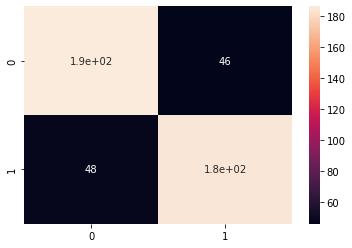

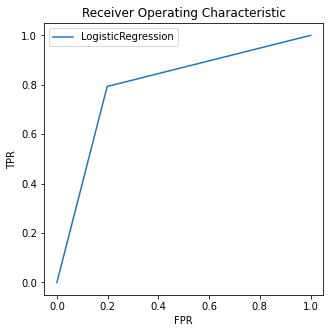

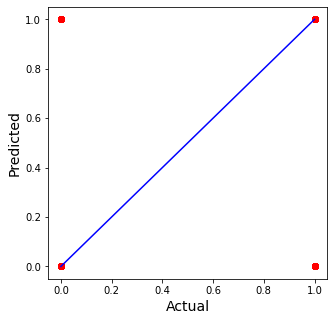

In [121]:
reg_func(LogisticRegression(),X,Y, 'LogisticRegression','lr')

# B) Decision Tree Classifier

Classification Report :
               precision    recall  f1-score   support

           0       0.83      0.81      0.82       232
           1       0.81      0.84      0.82       232

    accuracy                           0.82       464
   macro avg       0.82      0.82      0.82       464
weighted avg       0.82      0.82      0.82       464

Accuracy : 0.8211206896551724
Cross validation score : 0.8225556053142261
Accuracy and CV Score Diff : 0.001434915659053737
ROC AUC Score : 0.8211206896551724


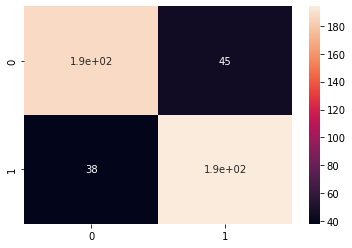

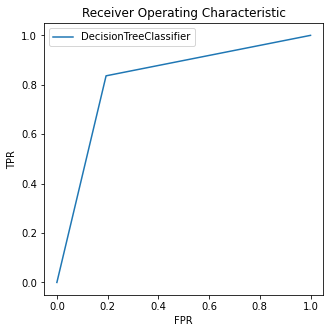

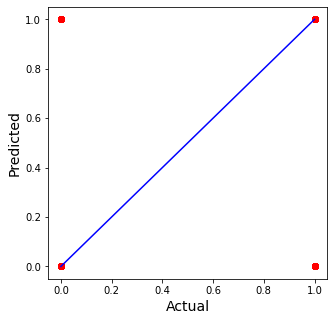

In [122]:
from sklearn.tree import DecisionTreeClassifier
reg_func(DecisionTreeClassifier(), X, Y, 'DecisionTreeClassifier','dtc')

# C) Random Forests Classifier

Classification Report :
               precision    recall  f1-score   support

           0       0.89      0.94      0.91       232
           1       0.94      0.88      0.91       232

    accuracy                           0.91       464
   macro avg       0.91      0.91      0.91       464
weighted avg       0.91      0.91      0.91       464

Accuracy : 0.9116379310344828
Cross validation score : 0.9188237050306014
Accuracy and CV Score Diff : 0.007185773996118638
ROC AUC Score : 0.9116379310344829


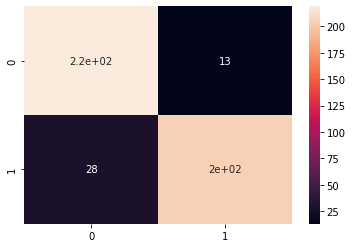

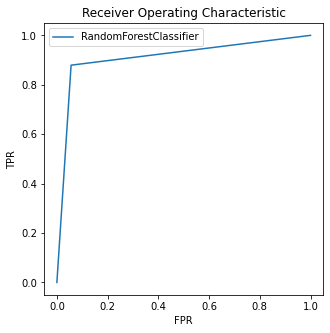

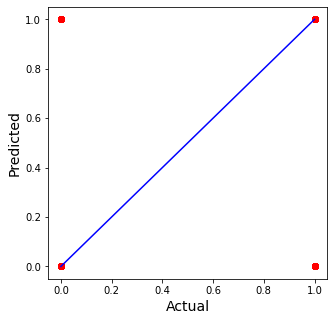

In [123]:
from sklearn.ensemble import RandomForestClassifier
reg_func(RandomForestClassifier(), X, Y,'RandomForestClassifier','rfc')

# D) SVM Classifier

Classification Report :
               precision    recall  f1-score   support

           0       0.88      0.91      0.90       232
           1       0.91      0.88      0.89       232

    accuracy                           0.89       464
   macro avg       0.89      0.89      0.89       464
weighted avg       0.89      0.89      0.89       464

Accuracy : 0.8943965517241379
Cross validation score : 0.8847253321391252
Accuracy and CV Score Diff : 0.009671219585012714
ROC AUC Score : 0.8943965517241379


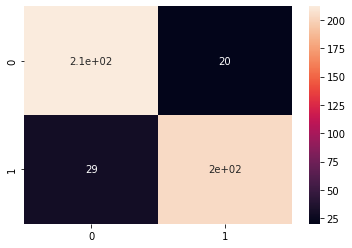

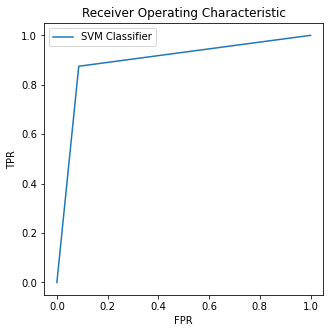

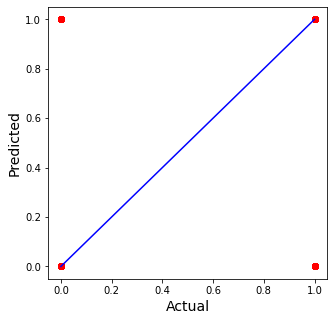

In [124]:
from sklearn.svm import SVC
reg_func(SVC(),X,Y,'SVM Classifier','svmc')

# E) SGD Classifier

Classification Report :
               precision    recall  f1-score   support

           0       0.73      0.77      0.75       232
           1       0.75      0.71      0.73       232

    accuracy                           0.74       464
   macro avg       0.74      0.74      0.74       464
weighted avg       0.74      0.74      0.74       464

Accuracy : 0.7392241379310345
Cross validation score : 0.792726526347216
Accuracy and CV Score Diff : 0.05350238841618149
ROC AUC Score : 0.7392241379310346


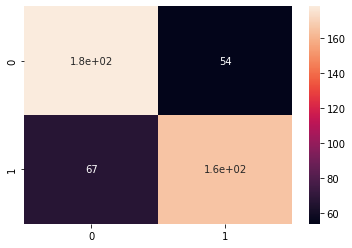

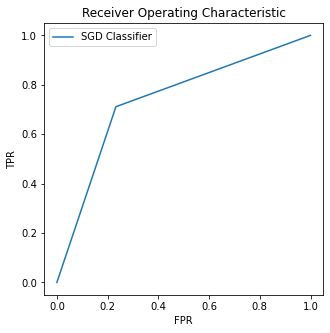

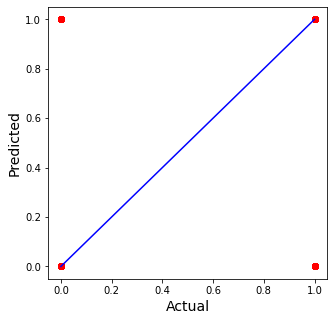

In [125]:
from sklearn.linear_model import SGDClassifier
reg_func(SGDClassifier(),X,Y,'SGD Classifier','sgdc')

# F) KNN (k Nearest Neighbour)

Classification Report :
               precision    recall  f1-score   support

           0       0.96      0.65      0.77       232
           1       0.73      0.97      0.84       232

    accuracy                           0.81       464
   macro avg       0.85      0.81      0.81       464
weighted avg       0.85      0.81      0.81       464

Accuracy : 0.8103448275862069
Cross validation score : 0.8380728466935363
Accuracy and CV Score Diff : 0.02772801910732947
ROC AUC Score : 0.8103448275862069


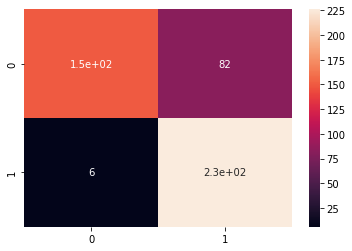

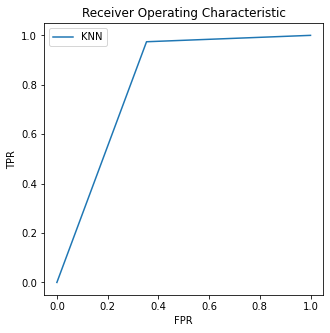

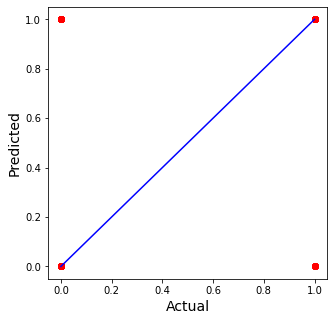

In [126]:
from sklearn.neighbors import KNeighborsClassifier
reg_func(KNeighborsClassifier(),X,Y,'KNN','knn')

# G) ADA Boost Classifier

Classification Report :
               precision    recall  f1-score   support

           0       0.88      0.90      0.89       232
           1       0.89      0.88      0.89       232

    accuracy                           0.89       464
   macro avg       0.89      0.89      0.89       464
weighted avg       0.89      0.89      0.89       464

Accuracy : 0.8879310344827587
Cross validation score : 0.8868842364532019
Accuracy and CV Score Diff : 0.0010467980295567614
ROC AUC Score : 0.8879310344827587


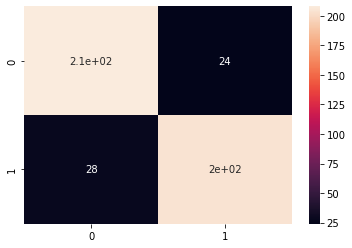

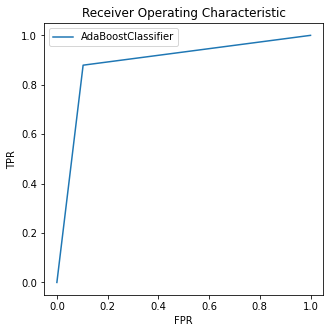

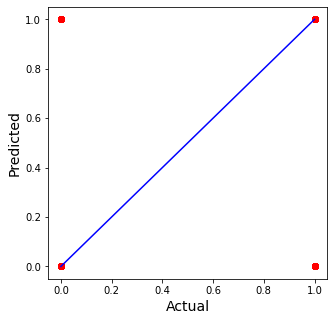

In [127]:
from sklearn.ensemble import AdaBoostClassifier
reg_func(AdaBoostClassifier(), X,Y,'AdaBoostClassifier','abc')

# H) Gradient Boost Classifier

Classification Report :
               precision    recall  f1-score   support

           0       0.90      0.92      0.91       232
           1       0.92      0.90      0.91       232

    accuracy                           0.91       464
   macro avg       0.91      0.91      0.91       464
weighted avg       0.91      0.91      0.91       464

Accuracy : 0.9094827586206896
Cross validation score : 0.9145133602030155
Accuracy and CV Score Diff : 0.005030601582325933
ROC AUC Score : 0.9094827586206896


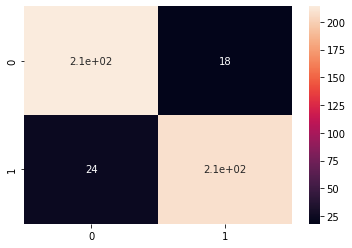

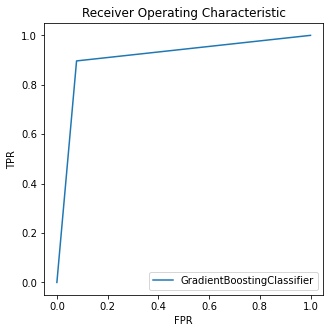

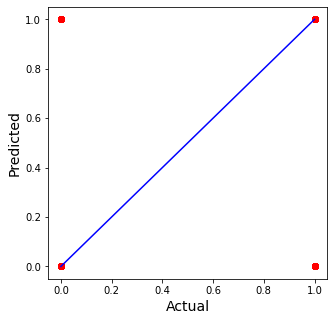

In [128]:
from sklearn.ensemble import GradientBoostingClassifier
reg_func(GradientBoostingClassifier(),X,Y,'GradientBoostingClassifier','gbc')

# I) Bagging Classifier

Classification Report :
               precision    recall  f1-score   support

           0       0.87      0.93      0.90       232
           1       0.93      0.87      0.90       232

    accuracy                           0.90       464
   macro avg       0.90      0.90      0.90       464
weighted avg       0.90      0.90      0.90       464

Accuracy : 0.8987068965517241
Cross validation score : 0.8925026123301985
Accuracy and CV Score Diff : 0.0062042842215256355
ROC AUC Score : 0.8987068965517241


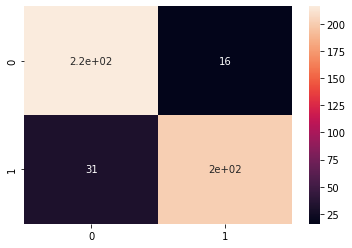

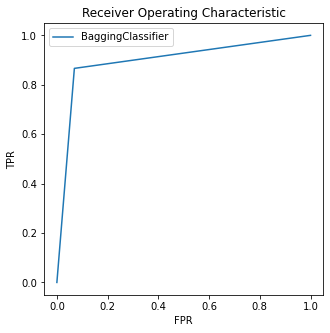

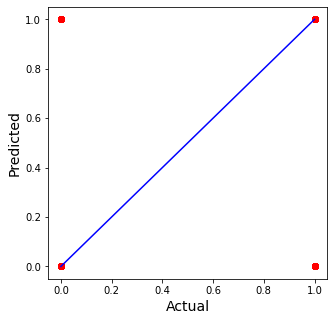

In [129]:
from sklearn.ensemble import BaggingClassifier

reg_func(BaggingClassifier(),X,Y,'BaggingClassifier','bc')

# Analysing Scores

In [130]:
model_stats = models_df.transpose()
model_stats

,0,1,2,3,4,5,6,7,8,9,10
lr,LogisticRegression,0.797414,0.809578,0.012164,186,46,48,184,0.797414,"[0.0, 0.19827586206896552, 1.0]","[0.0, 0.7931034482758621, 1.0]"
dtc,DecisionTreeClassifier,0.821121,0.822556,0.001435,187,45,38,194,0.821121,"[0.0, 0.1939655172413793, 1.0]","[0.0, 0.8362068965517241, 1.0]"
rfc,RandomForestClassifier,0.911638,0.918824,0.007186,219,13,28,204,0.911638,"[0.0, 0.05603448275862069, 1.0]","[0.0, 0.8793103448275862, 1.0]"
svmc,SVM Classifier,0.894397,0.884725,0.009671,212,20,29,203,0.894397,"[0.0, 0.08620689655172414, 1.0]","[0.0, 0.875, 1.0]"
sgdc,SGD Classifier,0.739224,0.792727,0.053502,178,54,67,165,0.739224,"[0.0, 0.23275862068965517, 1.0]","[0.0, 0.7112068965517241, 1.0]"
knn,KNN,0.810345,0.838073,0.027728,150,82,6,226,0.810345,"[0.0, 0.35344827586206895, 1.0]","[0.0, 0.9741379310344828, 1.0]"
abc,AdaBoostClassifier,0.887931,0.886884,0.001047,208,24,28,204,0.887931,"[0.0, 0.10344827586206896, 1.0]","[0.0, 0.8793103448275862, 1.0]"
gbc,GradientBoostingClassifier,0.909483,0.914513,0.005031,214,18,24,208,0.909483,"[0.0, 0.07758620689655173, 1.0]","[0.0, 0.896551724137931, 1.0]"
bc,BaggingClassifier,0.898707,0.892503,0.006204,216,16,31,201,0.898707,"[0.0, 0.06896551724137931, 1.0]","[0.0, 0.8663793103448276, 1.0]"


In [131]:
model_stats.columns = ['Model','Accuracy Score', 'Cross Validation Score', 'Difference','True +ve', 'False +ve', 'False -ve', 'True -ve','ROC Score','FPR','TPR']
model_stats

,Model,Accuracy Score,Cross Validation Score,Difference,True +ve,False +ve,False -ve,True -ve,ROC Score,FPR,TPR
lr,LogisticRegression,0.797414,0.809578,0.012164,186,46,48,184,0.797414,"[0.0, 0.19827586206896552, 1.0]","[0.0, 0.7931034482758621, 1.0]"
dtc,DecisionTreeClassifier,0.821121,0.822556,0.001435,187,45,38,194,0.821121,"[0.0, 0.1939655172413793, 1.0]","[0.0, 0.8362068965517241, 1.0]"
rfc,RandomForestClassifier,0.911638,0.918824,0.007186,219,13,28,204,0.911638,"[0.0, 0.05603448275862069, 1.0]","[0.0, 0.8793103448275862, 1.0]"
svmc,SVM Classifier,0.894397,0.884725,0.009671,212,20,29,203,0.894397,"[0.0, 0.08620689655172414, 1.0]","[0.0, 0.875, 1.0]"
sgdc,SGD Classifier,0.739224,0.792727,0.053502,178,54,67,165,0.739224,"[0.0, 0.23275862068965517, 1.0]","[0.0, 0.7112068965517241, 1.0]"
knn,KNN,0.810345,0.838073,0.027728,150,82,6,226,0.810345,"[0.0, 0.35344827586206895, 1.0]","[0.0, 0.9741379310344828, 1.0]"
abc,AdaBoostClassifier,0.887931,0.886884,0.001047,208,24,28,204,0.887931,"[0.0, 0.10344827586206896, 1.0]","[0.0, 0.8793103448275862, 1.0]"
gbc,GradientBoostingClassifier,0.909483,0.914513,0.005031,214,18,24,208,0.909483,"[0.0, 0.07758620689655173, 1.0]","[0.0, 0.896551724137931, 1.0]"
bc,BaggingClassifier,0.898707,0.892503,0.006204,216,16,31,201,0.898707,"[0.0, 0.06896551724137931, 1.0]","[0.0, 0.8663793103448276, 1.0]"


# ROC AUC CURVE for all the Model

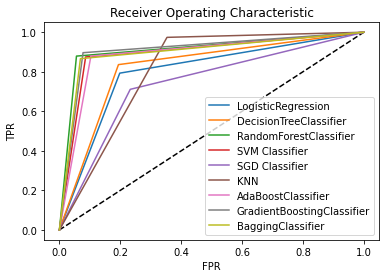

In [132]:
plt.plot([0,1],[0,1], 'k--')
for i in range(0,model_stats.shape[0]):
    plt.plot(model_stats['FPR'][i], model_stats['TPR'][i], label=model_stats['Model'][i])
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("Receiver Operating Characteristic")
plt.show()

# Visualizing Accuracy Score for all Models

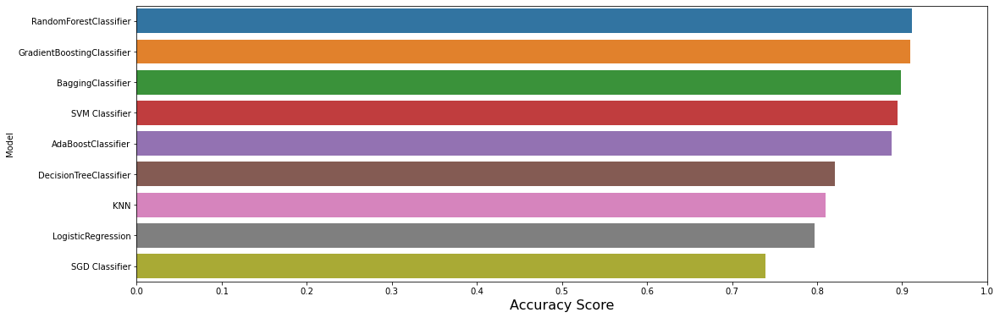

In [133]:
f, axe = plt.subplots(1,1, figsize=(18,6))

model_stats.sort_values(by=['Accuracy Score'], ascending=False, inplace=True)

sns.barplot(x='Accuracy Score', y='Model', data = model_stats, ax = axe)
axe.set_xlabel('Accuracy Score', size=16)
axe.set_ylabel('Model')
axe.set_xlim(0,1.0)
axe.set_xticks(np.arange(0, 1.1, 0.1))
plt.show()

Observation - Random Forest Classifier is giving the highest Accuracy score 91.1%

# Visualizing Cross Validation Score for all Models

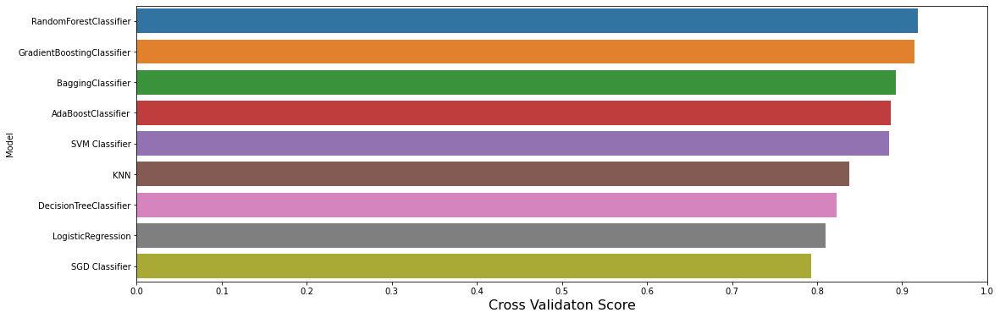

In [134]:
f, axe = plt.subplots(1,1, figsize=(18,6))

model_stats.sort_values(by=['Cross Validation Score'], ascending=False, inplace=True)

sns.barplot(x='Cross Validation Score', y='Model', data = model_stats, ax = axe)
axe.set_xlabel('Cross Validaton Score', size=16)
axe.set_ylabel('Model')
axe.set_xlim(0,1.0)
axe.set_xticks(np.arange(0, 1.1, 0.1))
plt.show()

Observation - Random Forest Classifier is giving the highest Cross validation Score 91.8%

# Visualizing False Predictions for all Models

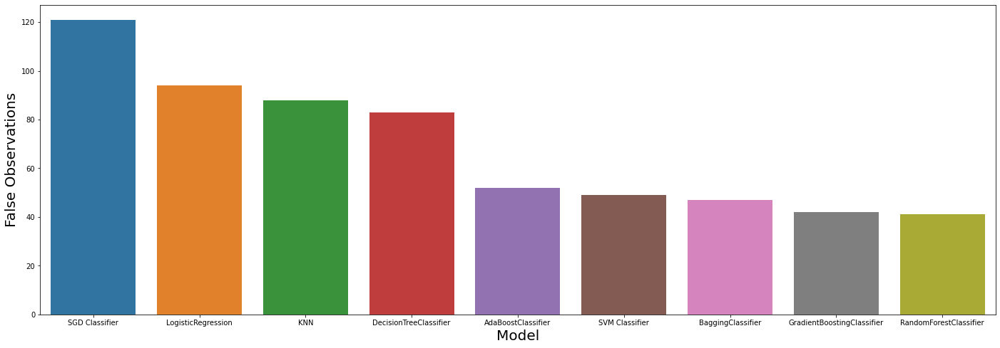

In [136]:
model_stats.sort_values(by=(['Accuracy Score']), ascending=True, inplace=True)

f, axe = plt.subplots(1,1, figsize=(24,8))
sns.barplot(x = model_stats['Model'], y=model_stats['False +ve'] + model_stats['False -ve'], ax = axe)
axe.set_xlabel('Model', size=20)
axe.set_ylabel('False Observations', size=20)

plt.show()

Observation - Random Forest Classifier is giving the least false predictions

Hence, Random Forest Classifier can be choosen as the best model for this binary classification problem

# Hyper Parameter Tuning with Random Forest Classifier

In [137]:
from sklearn.model_selection import GridSearchCV
parameters = {'criterion':['gini','entropy','log_loss'],"max_depth":['auto',2,4,6,8,10],'n_estimators':[100,150,200,250,300]}
GCV = GridSearchCV(RandomForestClassifier(),parameters,cv=KFold(n_splits=10, shuffle = True),scoring='accuracy')
GCV.fit(x_train,y_train)
GCV.best_params_

{'criterion': 'log_loss', 'max_depth': 10, 'n_estimators': 150}

Classification Report :
               precision    recall  f1-score   support

           0       0.89      0.94      0.91       232
           1       0.93      0.88      0.91       232

    accuracy                           0.91       464
   macro avg       0.91      0.91      0.91       464
weighted avg       0.91      0.91      0.91       464

Accuracy : 0.9094827586206896
Cross validation score : 0.912768696820421
Accuracy and CV Score Diff : 0.003285938199731442
ROC AUC Score : 0.9094827586206896


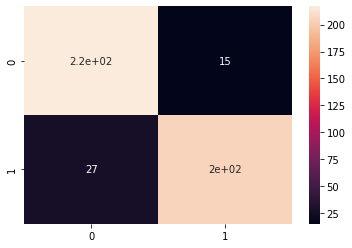

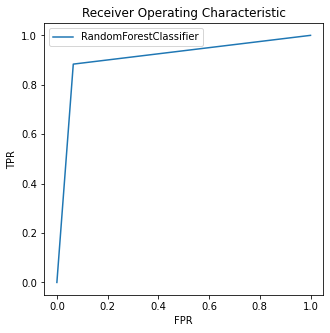

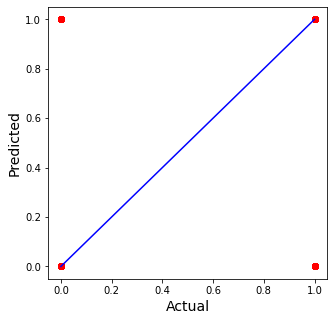

In [138]:
GCV.best_estimator_
rfc = RandomForestClassifier(criterion = 'log_loss', max_depth = 10, n_estimators = 150) 
reg_func(rfc, X, Y,'RandomForestClassifier','rfc')

# Saving the Model

In [139]:
import pickle
filename = 'hr_analytics.pkl'
pickle.dump(rfc,open(filename,'wb'))

# Conclusion

In [140]:
loaded_model = pickle.load(open('hr_analytics.pkl','rb'))
result = loaded_model.score(x_test, y_test)
print(result*100)

90.94827586206897


In [141]:
conclusion = pd.DataFrame([loaded_model.predict(x_test)[:],y_test[:]],index=['Predicted','Original'])
conclusion

,0,1,2,3,4,5,6,7,8,9,...,454,455,456,457,458,459,460,461,462,463
Predicted,0,1,0,1,1,1,0,1,0,0,...,0,0,1,1,1,1,0,0,0,0
Original,1,1,0,0,1,1,0,1,0,0,...,1,0,0,1,1,1,0,0,0,0


# This model is 91% Accurate